In [1]:
%run ../scripts/notebook_settings.py
import sgkit as sg
import xarray as xr
import glob

In [2]:
glob.glob("../results/window_stats/*_100kb_pi.txt")

['../results/window_stats/Pithecia_vanzolinii_ssp_100kb_pi.txt',
 '../results/window_stats/Callithrix_kuhlii_ssp_100kb_pi.txt',
 '../results/window_stats/Hylobates_pileatus_ssp_100kb_pi.txt',
 '../results/window_stats/Plecturocebus_cupreus_ssp_100kb_pi.txt',
 '../results/window_stats/Alouatta_belzebul_ssp_100kb_pi.txt',
 '../results/window_stats/Trachypithecus_poliocephalus_ssp_100kb_pi.txt',
 '../results/window_stats/Macaca_nemestrina_ssp_100kb_pi.txt',
 '../results/window_stats/Papio_hamadryas_ssp_100kb_pi.txt',
 '../results/window_stats/Propithecus_diadema_ssp_100kb_pi.txt',
 '../results/window_stats/Cercopithecus_denti_ssp_100kb_pi.txt',
 '../results/window_stats/Cercopithecus_hamlyni_ssp_100kb_pi.txt',
 '../results/window_stats/Cebus_albifrons_ssp_100kb_pi.txt',
 '../results/window_stats/Cheirogaleus_medius_ssp_100kb_pi.txt',
 '../results/window_stats/Plecturocebus_brunneus_ssp_100kb_pi.txt',
 '../results/window_stats/Macaca_leucogenys_ssp_100kb_pi.txt',
 '../results/window_stats/

In [3]:
df_l = []
for p in glob.glob("../results/window_stats/*_100kb_pi.txt"):
    df_pi = pd.read_csv(p, sep="\t", index_col=[0])
    aut_pi = df_pi.loc[(df_pi.callable_frac >= 0.75) & (df_pi.chr_type == "aut")]["pi"].mean()
    df_pi["norm_pi"] = df_pi["pi"]/aut_pi
    df_l.append(df_pi)
df_pi100kb = pd.concat(df_l)

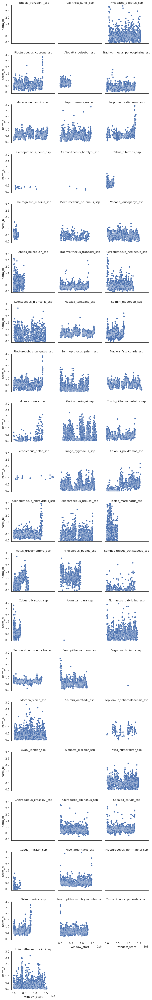

In [4]:
g = sns.FacetGrid(df_pi100kb.loc[(df_pi100kb["chr_type"] == "chrX") &
                                (df_pi100kb.callable_frac >= 0.75)], col="species", col_wrap=3)
g.map(sns.scatterplot, "window_start", "norm_pi", linewidth = 0.25)
g.set(ylim=(-0.1, 3))
g.set_titles(col_template="{col_name}", row_template="{row_name}")

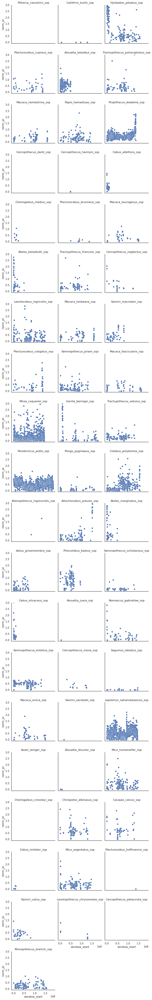

In [5]:
g = sns.FacetGrid(df_pi100kb.loc[(df_pi100kb["chr_type"] == "chrX") &
                                (df_pi100kb.callable_frac <= 0.75)], col="species", col_wrap=3)
g.map(sns.scatterplot, "window_start", "norm_pi", linewidth = 0.25)
g.set(ylim=(-0.1, 3))
g.set_titles(col_template="{col_name}", row_template="{row_name}")

In [6]:
df_pi100kb.loc[(df_pi100kb.species == "Avahi_laniger_ssp") &
              (df_pi100kb.chr_type == "chrX")]

,window_start,pi,chrom,window_end,callable_frac,chr_type,species,norm_pi
0,0,NaN,HiC_scaffold_2,100000,0.35138,chrX,Avahi_laniger_ssp,NaN
1,100000,NaN,HiC_scaffold_2,200000,0.37222,chrX,Avahi_laniger_ssp,NaN
2,200000,NaN,HiC_scaffold_2,300000,0.20395,chrX,Avahi_laniger_ssp,NaN
3,300000,NaN,HiC_scaffold_2,400000,0.41466,chrX,Avahi_laniger_ssp,NaN
4,400000,NaN,HiC_scaffold_2,500000,0.48657,chrX,Avahi_laniger_ssp,NaN
...,...,...,...,...,...,...,...,...
1365,136500000,NaN,HiC_scaffold_2,136600000,0.17303,chrX,Avahi_laniger_ssp,NaN
1366,136600000,NaN,HiC_scaffold_2,136700000,0.28813,chrX,Avahi_laniger_ssp,NaN
1367,136700000,NaN,HiC_scaffold_2,136800000,0.17862,chrX,Avahi_laniger_ssp,NaN
1368,136800000,NaN,HiC_scaffold_2,136900000,0.23513,chrX,Avahi_laniger_ssp,NaN


In [7]:
df_pi100kb["frac_bins"] = pd.cut(df_pi100kb["callable_frac"], bins=[0, 0.5, 0.75, 0.9, 0.95, 1])

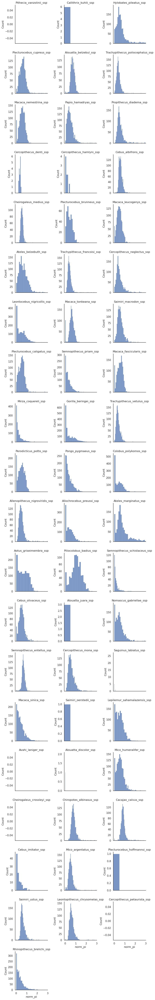

In [8]:
g = sns.FacetGrid(df_pi100kb.loc[(df_pi100kb["chr_type"] == "chrX")], col="species", col_wrap=3, sharey=False)
g.map(sns.histplot, "norm_pi", common_norm=False)
g.set(xlim=(-0.1, 3))
g.set_titles(col_template="{col_name}", row_template="{row_name}")

/home/eriks/miniconda3/envs/primatediversity2/lib/python3.12/site-packages/seaborn/axisgrid.py:718: UserWarning: Using the violinplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


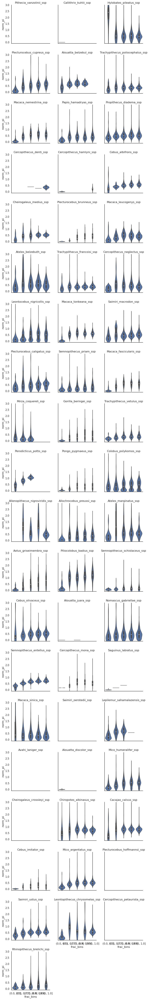

In [9]:
g = sns.FacetGrid(df_pi100kb.loc[(df_pi100kb["chr_type"] == "chrX")], col="species", col_wrap=3)
g.map(sns.violinplot, "frac_bins", "norm_pi")
g.set(ylim=(-0.1, 3))
g.set_titles(col_template="{col_name}", row_template="{row_name}")

In [10]:
df_chromcount = df_pi100kb.loc[df_pi100kb["chr_type"] == "chrX"][["species", "chrom"]].value_counts().reset_index()

In [11]:
df_chromcount.groupby("species")["count"].sum()

species
Allenopithecus_nigroviridis_ssp     1323
Allochrocebus_preussi_ssp           1520
Alouatta_belzebul_ssp               1377
Alouatta_discolor_ssp               1378
Alouatta_juara_ssp                  1377
Aotus_griseimembra_ssp              1367
Ateles_belzebuth_ssp                1377
Ateles_marginatus_ssp               1377
Avahi_laniger_ssp                   1370
Cacajao_calvus_ssp                  1295
Callithrix_kuhlii_ssp               1469
Cebus_albifrons_ssp                 1331
Cebus_imitator_ssp                  1331
Cebus_olivaceus_ssp                 1331
Cercopithecus_denti_ssp             1242
Cercopithecus_hamlyni_ssp           1242
Cercopithecus_mona_ssp              1242
Cercopithecus_neglectus_ssp         1242
Cercopithecus_petaurista_ssp        1242
Cheirogaleus_crossleyi_ssp          1078
Cheirogaleus_medius_ssp             1078
Chiropotes_albinasus_ssp            1295
Colobus_polykomos_ssp               1558
Gorilla_beringei_ssp                1775
Hylobate

In [12]:
df_chromcount.groupby("species")["chrom"].nunique()

species
Allenopithecus_nigroviridis_ssp      1
Allochrocebus_preussi_ssp            1
Alouatta_belzebul_ssp                7
Alouatta_discolor_ssp                7
Alouatta_juara_ssp                   7
Aotus_griseimembra_ssp               4
Ateles_belzebuth_ssp                 7
Ateles_marginatus_ssp                7
Avahi_laniger_ssp                    1
Cacajao_calvus_ssp                   1
Callithrix_kuhlii_ssp                1
Cebus_albifrons_ssp                 20
Cebus_imitator_ssp                  20
Cebus_olivaceus_ssp                 20
Cercopithecus_denti_ssp              1
Cercopithecus_hamlyni_ssp            1
Cercopithecus_mona_ssp               1
Cercopithecus_neglectus_ssp          1
Cercopithecus_petaurista_ssp         1
Cheirogaleus_crossleyi_ssp           9
Cheirogaleus_medius_ssp              9
Chiropotes_albinasus_ssp             1
Colobus_polykomos_ssp                1
Gorilla_beringei_ssp                 1
Hylobates_pileatus_ssp               1
Leontocebus_nigri

In [13]:
df_pi100kb.loc[df_pi100kb.chr_type == "chrX"].groupby(["species"])["pi"].mean().reset_index()["pi"]/df_pi100kb.loc[df_pi100kb.chr_type == "aut"].groupby(["species"])["pi"].mean().reset_index()["pi"]

0     0.551678
1     0.445198
2     0.727340
3     0.008609
4     0.000000
5     0.741620
6     0.659914
7     0.774239
8          NaN
9     0.861149
10    0.000000
11    0.595689
12    0.258393
13    0.538361
14    0.347465
15    0.137806
16    0.578775
17    0.543666
18         NaN
19         NaN
20    0.545523
21    0.831559
22    0.421429
23    0.470327
24    0.677804
25    0.458775
26    0.631430
27    0.569328
28    0.567644
29    0.484391
30    0.591514
31    0.435484
32    0.627211
33    0.527441
34    0.520923
35    0.407626
36    0.515415
37    0.475417
38    0.651126
39    1.044740
40         NaN
41    0.418977
42    0.525302
43    0.621925
44    0.000000
45    0.368178
46    0.695051
47    0.385658
48    0.019570
49    0.579991
50    0.000000
51    0.656741
52    0.696178
53    0.312539
54    0.207103
55    0.427244
56    0.415921
57    0.384655
Name: pi, dtype: float64

In [14]:
df_pi100kb.loc[df_pi100kb.chr_type == "chrX"].groupby(["species"]).count().reset_index().species

0      Allenopithecus_nigroviridis_ssp
1            Allochrocebus_preussi_ssp
2                Alouatta_belzebul_ssp
3                Alouatta_discolor_ssp
4                   Alouatta_juara_ssp
5               Aotus_griseimembra_ssp
6                 Ateles_belzebuth_ssp
7                Ateles_marginatus_ssp
8                    Avahi_laniger_ssp
9                   Cacajao_calvus_ssp
10               Callithrix_kuhlii_ssp
11                 Cebus_albifrons_ssp
12                  Cebus_imitator_ssp
13                 Cebus_olivaceus_ssp
14             Cercopithecus_denti_ssp
15           Cercopithecus_hamlyni_ssp
16              Cercopithecus_mona_ssp
17         Cercopithecus_neglectus_ssp
18        Cercopithecus_petaurista_ssp
19          Cheirogaleus_crossleyi_ssp
20             Cheirogaleus_medius_ssp
21            Chiropotes_albinasus_ssp
22               Colobus_polykomos_ssp
23                Gorilla_beringei_ssp
24              Hylobates_pileatus_ssp
25         Leontocebus_ni

In [15]:
mean_pis = pd.DataFrame({"species": df_pi100kb.loc[df_pi100kb.chr_type == "chrX"].groupby(["species"]).count().reset_index().species,
             "X_a_ratio": df_pi100kb.loc[df_pi100kb.chr_type == "chrX"].groupby(["species"])["pi"].mean().reset_index()["pi"]/df_pi100kb.loc[df_pi100kb.chr_type == "aut"].groupby(["species"])["pi"].mean().reset_index()["pi"],
             "aut_pi": df_pi100kb.loc[df_pi100kb.chr_type == "aut"].groupby(["species"])["pi"].mean().reset_index()["pi"]})

In [16]:
mean_pis

,species,X_a_ratio,aut_pi
0,Allenopithecus_nigroviridis_ssp,0.551678,137.790676
1,Allochrocebus_preussi_ssp,0.445198,228.356542
2,Alouatta_belzebul_ssp,0.727340,427.261185
3,Alouatta_discolor_ssp,0.008609,183.923490
4,Alouatta_juara_ssp,0.000000,181.139608
5,Aotus_griseimembra_ssp,0.741620,144.941488
6,Ateles_belzebuth_ssp,0.659914,246.405878
7,Ateles_marginatus_ssp,0.774239,144.846746
8,Avahi_laniger_ssp,NaN,285.819263
9,Cacajao_calvus_ssp,0.861149,136.129495


<Axes: xlabel='aut_pi', ylabel='X_a_ratio'>

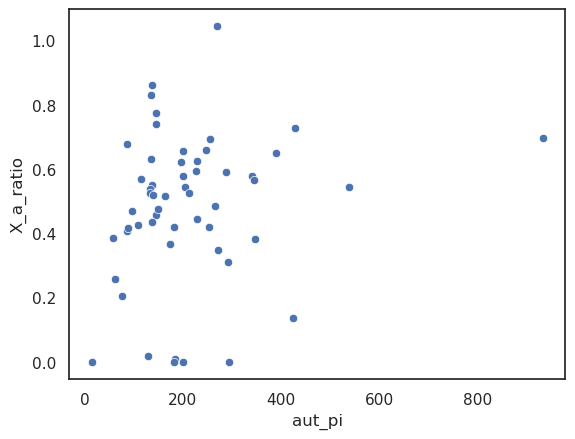

In [17]:
sns.scatterplot(mean_pis, x="aut_pi", y="X_a_ratio")

Compara Fst, het and pi.

In [18]:
(len(glob.glob("../results/window_stats/*_100kb_pi.txt")),
len(glob.glob("../results/window_stats/*_100kb_het.txt")),
len(glob.glob("../results/window_stats/*_Fst.txt")))

(58, 80, 130)

In [19]:
metadata_path = "/home/eriks/primatediversity/data/gVCFs_recalling_10_12_2024_metadata/"
full_dfs = []
for x in glob.glob(metadata_path+"*_individuals.txt"):
    short_form = x.split("/")[-1].split("_")[0]
    long_form = x.split("/")[-1]
    # Loading the various metadata files. Metadata, contig information, callability bed.
    metadata_path = "/home/eriks/primatediversity/data/gVCFs_recalling_10_12_2024_metadata/"
    metadata_df = pd.read_csv(metadata_path+"{}_individuals.txt".format(short_form), sep="\t")
    metadata_df["SEX_I"] = [0 if x == "F" else 1 for x in metadata_df.GENETIC_SEX]
    regions_df = pd.read_csv(metadata_path+"{}_regions_and_batches.txt".format(short_form), sep="\t")
    for f in metadata_df.GVCF_FOLDER.unique():
        r_df = regions_df.loc[regions_df.REFERENCE_FOLDER == f]
        if os.path.exists("../results/window_stats/{}_Fst.txt".format(f)) and \
           os.path.exists("../results/window_stats/{}_100kb_het.txt".format(f)) and \
           os.path.exists("../results/window_stats/{}_100kb_pi.txt".format(f)):
            print(f)
            full_dfs.append(f)

Saguinus_labiatus_ssp
Cercopithecus_denti_ssp
Cercopithecus_hamlyni_ssp
Cercopithecus_mona_ssp
Cercopithecus_neglectus_ssp
Perodicticus_potto_ssp
Ateles_belzebuth_ssp
Allenopithecus_nigroviridis_ssp
Cheirogaleus_medius_ssp
Semnopithecus_entellus_ssp
Semnopithecus_schistaceus_ssp
Avahi_laniger_ssp
Mico_argentatus_ssp
Propithecus_diadema_ssp
Aotus_griseimembra_ssp
Plecturocebus_brunneus_ssp
Plecturocebus_caligatus_ssp
Plecturocebus_cupreus_ssp
Cebus_albifrons_ssp
Cebus_imitator_ssp
Cebus_olivaceus_ssp
Alouatta_belzebul_ssp
Alouatta_discolor_ssp
Alouatta_juara_ssp
Macaca_tonkeana_ssp
Macaca_leucogenys_ssp
Hylobates_pileatus_ssp
Trachypithecus_francoisi_ssp
Trachypithecus_poliocephalus_ssp
Cacajao_calvus_ssp
Leontopithecus_chrysomelas_ssp
Chiropotes_albinasus_ssp
Saimiri_macrodon_ssp
Saimiri_ustus_ssp
Rhinopithecus_brelichi_ssp


In [20]:
len(full_dfs)

35

In [21]:
df_lp, df_lh, df_lfst = [], [], []
for x in full_dfs[6:7]:
    df_pi = pd.read_csv("../results/window_stats/{}_100kb_pi.txt".format(x), sep="\t", index_col=[0])
    aut_pi = df_pi.loc[(df_pi.callable_frac >= 0.75) & (df_pi.chr_type == "aut")]["pi"].mean()
    df_pi["norm_pi"] = df_pi["pi"]/aut_pi
    df_lp.append(df_pi)
    df_het = pd.read_csv("../results/window_stats/{}_100kb_het.txt".format(x), sep="\t", index_col=[0])
    df_lh.append(df_het)
    df_fst = pd.read_csv("../results/window_stats/{}_Fst.txt".format(x), sep="\t", index_col=[0])
    df_lfst.append(df_fst)

In [22]:
df_pi.groupby("chr_type")[["pi"]].mean()

,pi
chr_type,
aut,246.405878
chrX,162.606633


In [23]:
df_fst
#sns.clustermap(df_fst.loc[df_fst.chr_type == "aut"].iloc[:,:len(df_fst.columns)-4].clip(0).fillna(0))

,PD_0004,PD_0138,chrom,variants_used,stat,chr_type,species
0,NaN,0.029144,CAJZLT010000072.1,38368,Fst,ChrX,Ateles_belzebuth_ssp
1,0.029144,NaN,CAJZLT010000072.1,38368,Fst,ChrX,Ateles_belzebuth_ssp
0,8150.000000,8732.500000,CAJZLT010000072.1,38368,Divergence,ChrX,Ateles_belzebuth_ssp
1,8732.500000,8806.000000,CAJZLT010000072.1,38368,Divergence,ChrX,Ateles_belzebuth_ssp
0,NaN,0.050373,CAJZLT010000001.1,1238649,Fst,Aut,Ateles_belzebuth_ssp
1,0.050373,NaN,CAJZLT010000001.1,1238649,Fst,Aut,Ateles_belzebuth_ssp
0,318424.000000,349830.000000,CAJZLT010000001.1,1238649,Divergence,Aut,Ateles_belzebuth_ssp
1,349830.000000,345992.000000,CAJZLT010000001.1,1238649,Divergence,Aut,Ateles_belzebuth_ssp
0,NaN,0.092396,CAJZLT010000040.1,180564,Fst,ChrX,Ateles_belzebuth_ssp
1,0.092396,NaN,CAJZLT010000040.1,180564,Fst,ChrX,Ateles_belzebuth_ssp


In [24]:
df_het.groupby("chr_type")[df_het.columns[:-6]].mean()

,PD_0004,PD_0138
chr_type,,
aut,225.318404,245.342197
chrX,158.416848,159.273057


In [25]:
df_het#.groupby("chr_type")[["PD_0120", "PD_0348"]].mean()

,PD_0004,PD_0138,window_start,chrom,window_end,callable_frac,chr_type,species
0,256.0,251.0,0,CAJZLT010000072.1,100000,0.93673,chrX,Ateles_belzebuth_ssp
1,2.0,11.0,100000,CAJZLT010000072.1,200000,0.82173,chrX,Ateles_belzebuth_ssp
2,31.0,24.0,200000,CAJZLT010000072.1,300000,0.79900,chrX,Ateles_belzebuth_ssp
3,16.0,68.0,300000,CAJZLT010000072.1,400000,0.91976,chrX,Ateles_belzebuth_ssp
4,4.0,54.0,400000,CAJZLT010000072.1,500000,0.92213,chrX,Ateles_belzebuth_ssp
...,...,...,...,...,...,...,...,...
2801,3.0,145.0,27300000,CAJZLT010000034.1,27400000,0.95803,chrX,Ateles_belzebuth_ssp
2802,8.0,64.0,27400000,CAJZLT010000034.1,27500000,0.89454,chrX,Ateles_belzebuth_ssp
2803,12.0,184.0,27500000,CAJZLT010000034.1,27600000,0.93365,chrX,Ateles_belzebuth_ssp
2804,25.0,182.0,27600000,CAJZLT010000034.1,27700000,0.94971,chrX,Ateles_belzebuth_ssp


In [26]:
df_lp, df_lh, df_lfst = [], [], []
for x in full_dfs[10:11]:
    df_pi = pd.read_csv("../results/window_stats/{}_100kb_pi.txt".format(x), sep="\t", index_col=[0])
    aut_pi = df_pi.loc[(df_pi.callable_frac >= 0.75) & (df_pi.chr_type == "aut")]["pi"].mean()
    df_pi["norm_pi"] = df_pi["pi"]/aut_pi
    df_lp.append(df_pi)
    df_het = pd.read_csv("../results/window_stats/{}_100kb_het.txt".format(x), sep="\t", index_col=[0])
    df_lh.append(df_het)
    df_fst = pd.read_csv("../results/window_stats/{}_Fst.txt".format(x), sep="\t", index_col=[0])
    df_lfst.append(df_fst)

In [27]:
df_pi.groupby("chr_type")[["pi"]].mean()

,pi
chr_type,
aut,76.630952
chrX,15.870462


In [28]:
df_fst.loc[df_fst.chr_type == "Aut"]

,PD_0593,PD_0594,chrom,variants_used,stat,chr_type,species
0,NaN,0.500413,NW_022680471.1,13879,Fst,Aut,Semnopithecus_schistaceus_ssp
1,0.500413,NaN,NW_022680471.1,13879,Fst,Aut,Semnopithecus_schistaceus_ssp
0,846.000000,1212.000000,NW_022680471.1,13879,Divergence,Aut,Semnopithecus_schistaceus_ssp
1,1212.000000,365.000000,NW_022680471.1,13879,Divergence,Aut,Semnopithecus_schistaceus_ssp


In [29]:
from scipy.spatial.distance import squareform
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, labels=aut_fst.columns, orientation="left", **kwargs)


In [30]:
aut_fst = df_fst.loc[(df_fst.chr_type == "Aut") &
                    (df_fst["stat"] == "Fst")].iloc[:,:len(df_fst.columns)-5].fillna(0)
aut_fst

,PD_0593,PD_0594
0,0.000000,0.500413
1,0.500413,0.000000


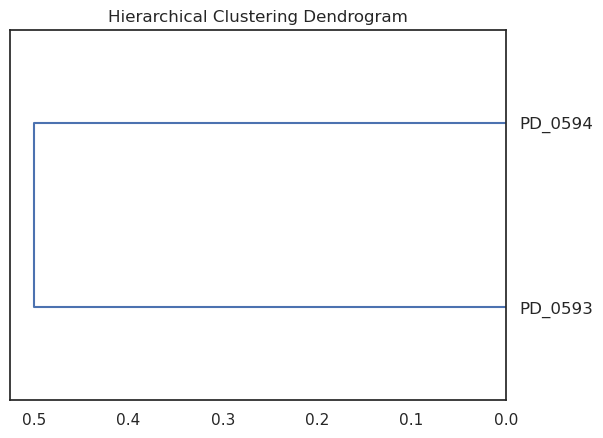

In [31]:
model = AgglomerativeClustering(distance_threshold=0.1, n_clusters=None, metric="precomputed", linkage="average")

model = model.fit(aut_fst.clip(0))
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=10)

Going through the various species and making a diagnostic collection to better understand the data distributions.

/tmp/5425794/ipykernel_3792431/271857596.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 2, figsize=(18, 10))
/home/eriks/miniconda3/envs/primatediversity2/lib/python3.12/site-packages/scipy/cluster/hierarchy.py:2978: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim([dvw, 0])
/home/eriks/miniconda3/envs/primatediversity2/lib/python3.12/site-packages/scipy/cluster/hierarchy.py:2978: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim([dvw, 0])
/home/eriks/miniconda3/envs/primatediversity2/lib/python3.12/site-packages/scipy/cluster/hier

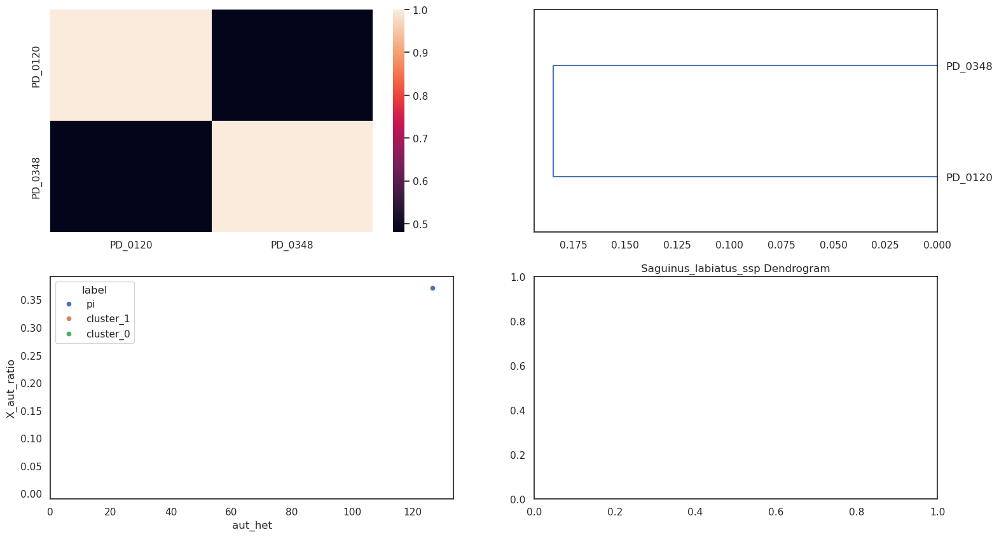

<Figure size 640x480 with 0 Axes>

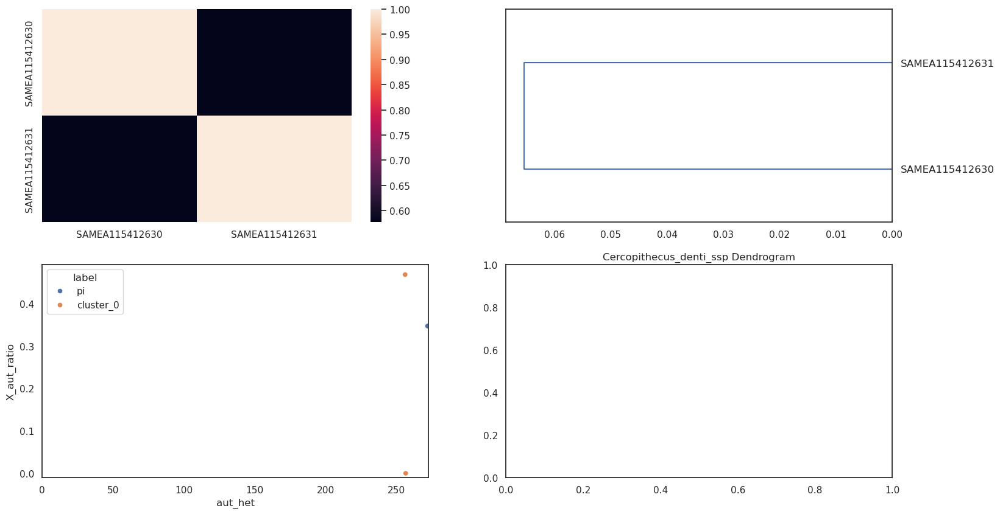

<Figure size 640x480 with 0 Axes>

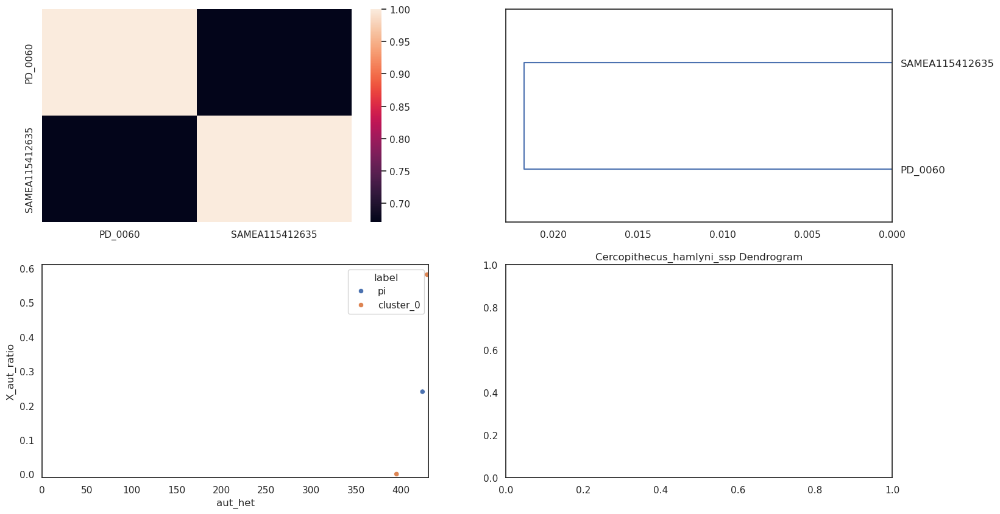

<Figure size 640x480 with 0 Axes>

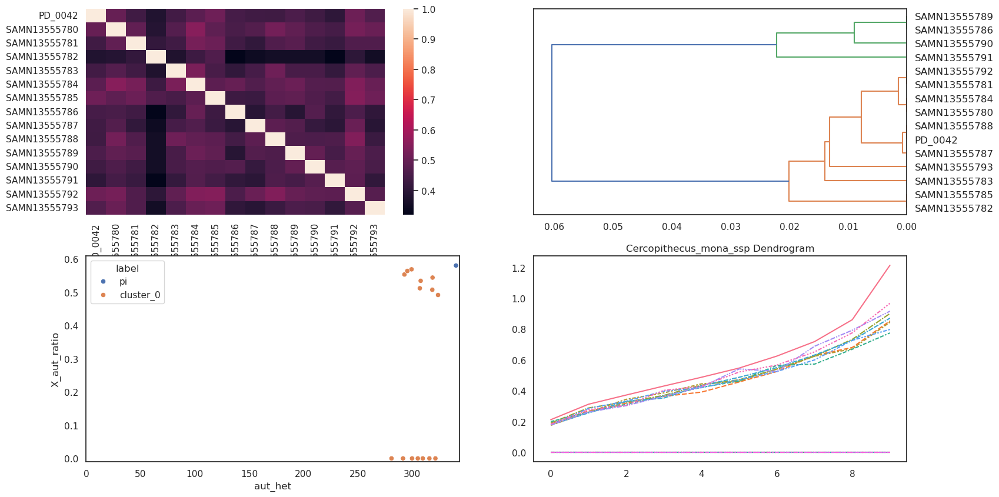

<Figure size 640x480 with 0 Axes>

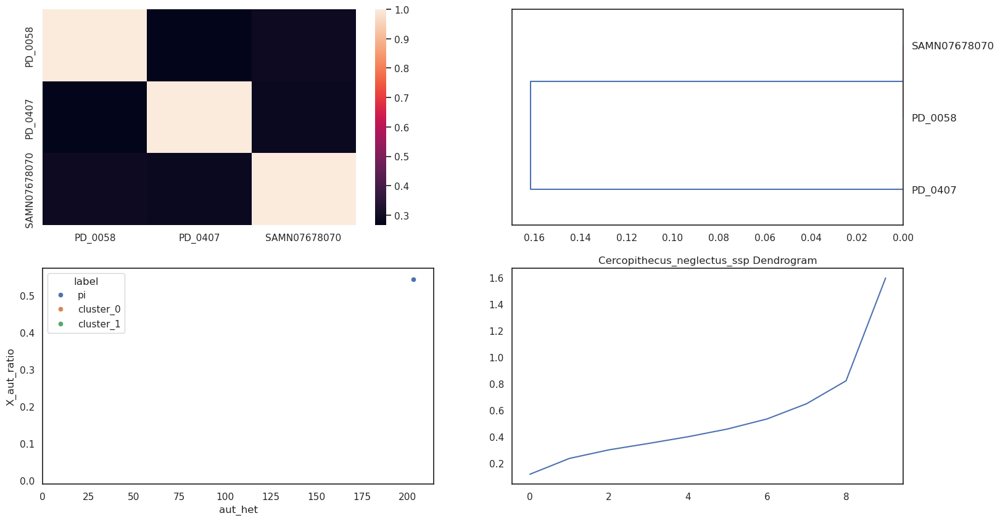

<Figure size 640x480 with 0 Axes>

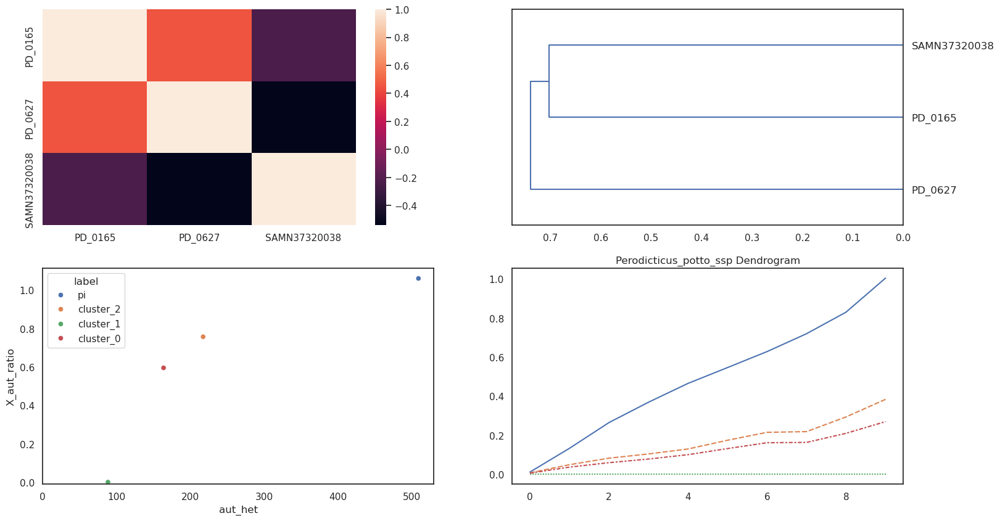

<Figure size 640x480 with 0 Axes>

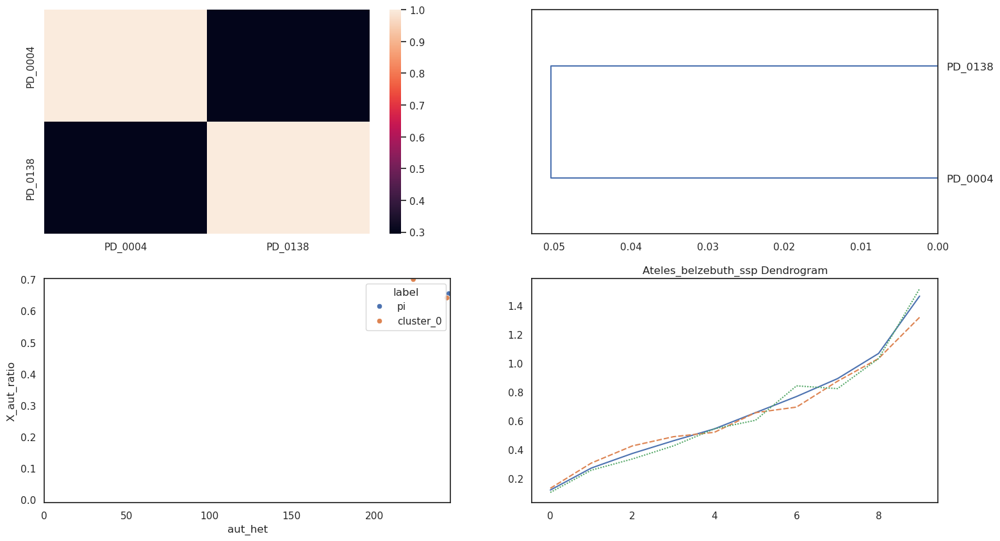

<Figure size 640x480 with 0 Axes>

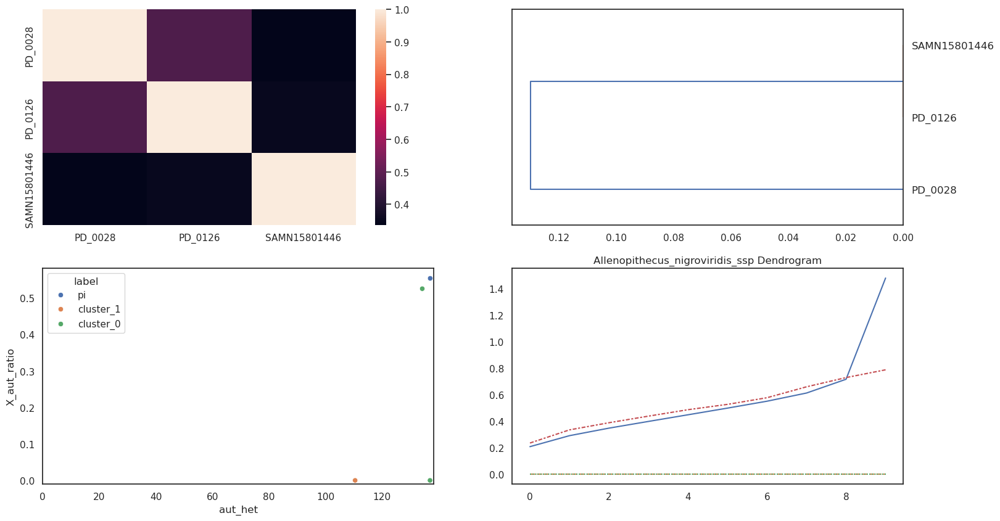

<Figure size 640x480 with 0 Axes>

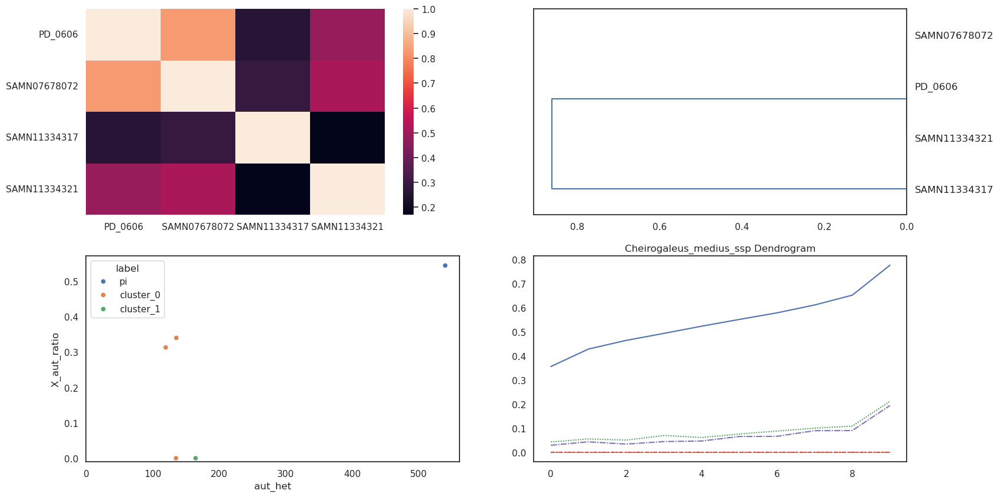

<Figure size 640x480 with 0 Axes>

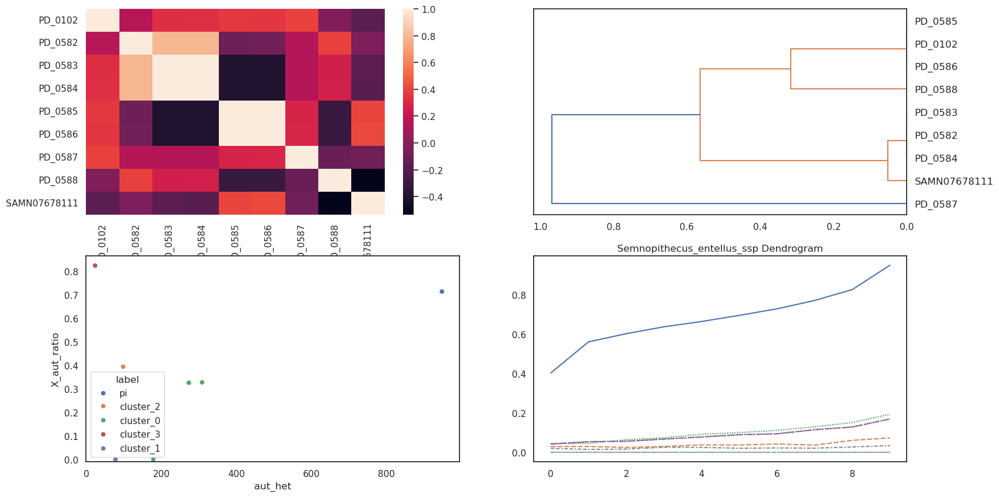

<Figure size 640x480 with 0 Axes>

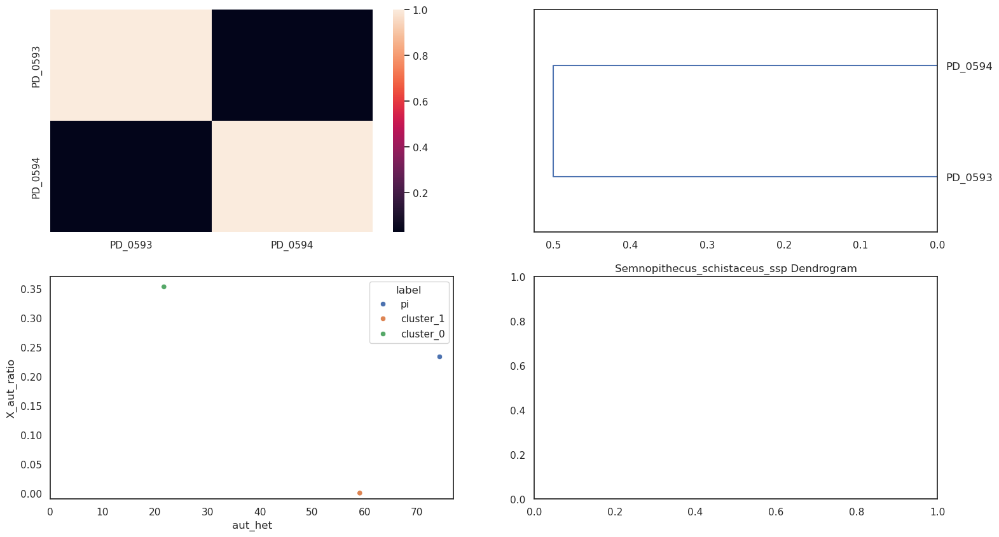

<Figure size 640x480 with 0 Axes>

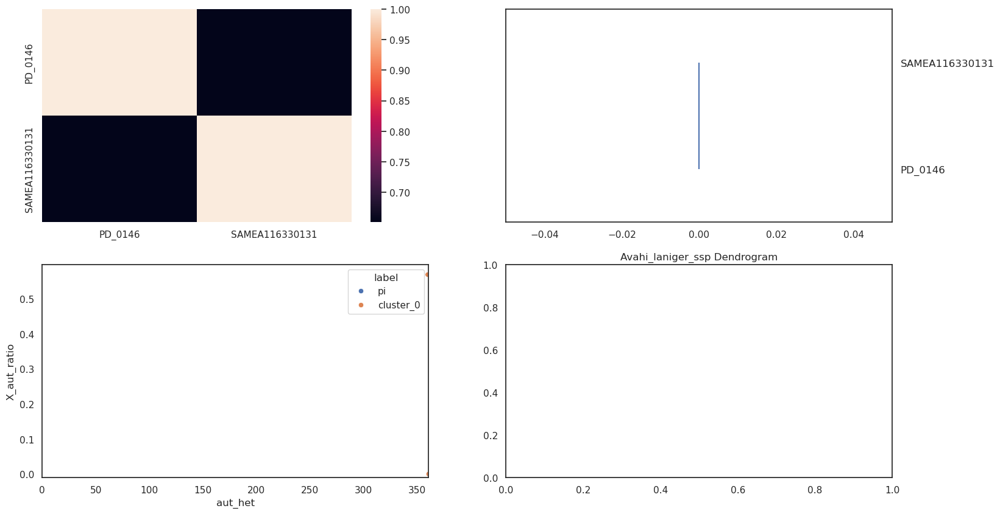

<Figure size 640x480 with 0 Axes>

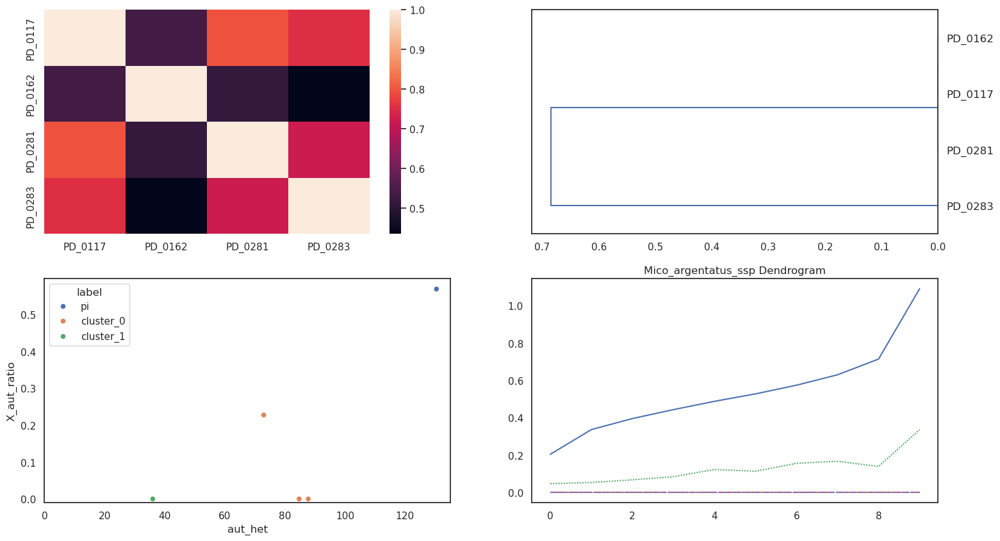

<Figure size 640x480 with 0 Axes>

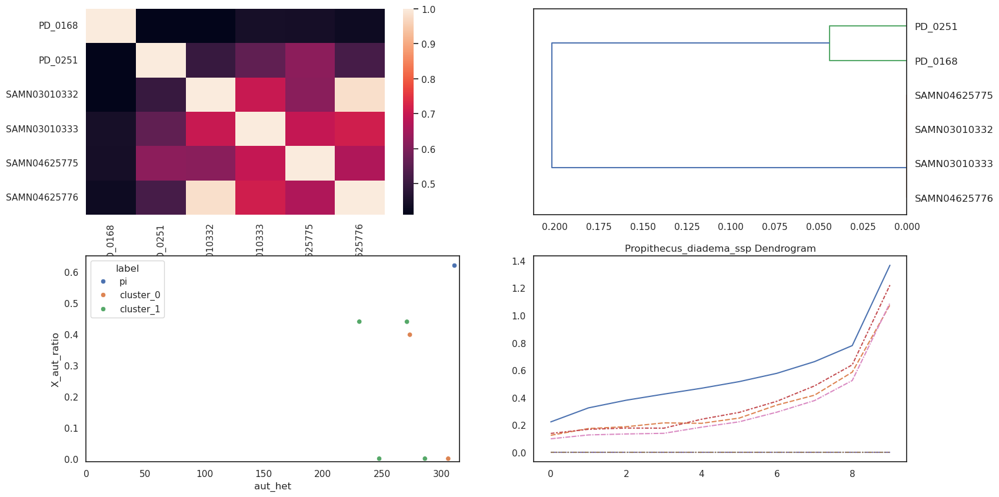

<Figure size 640x480 with 0 Axes>

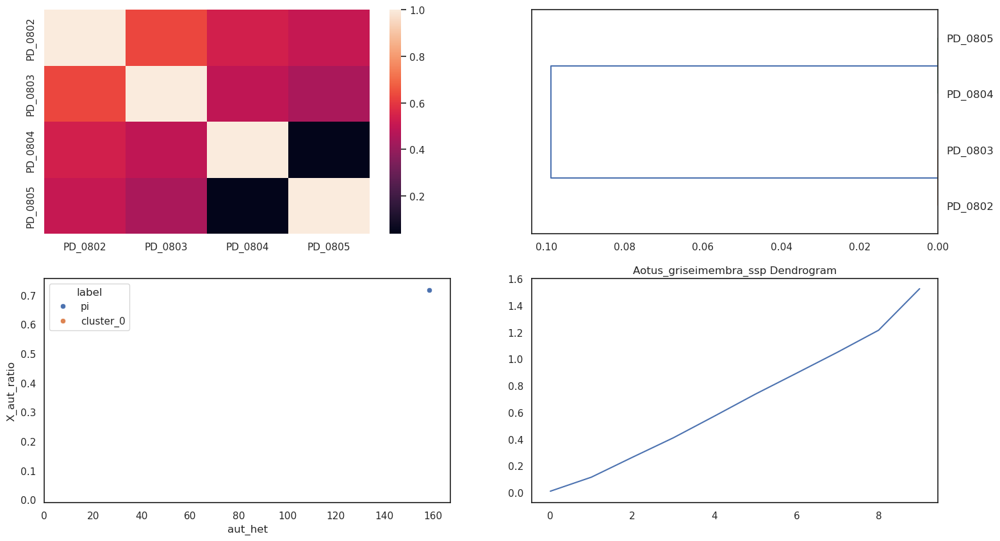

<Figure size 640x480 with 0 Axes>

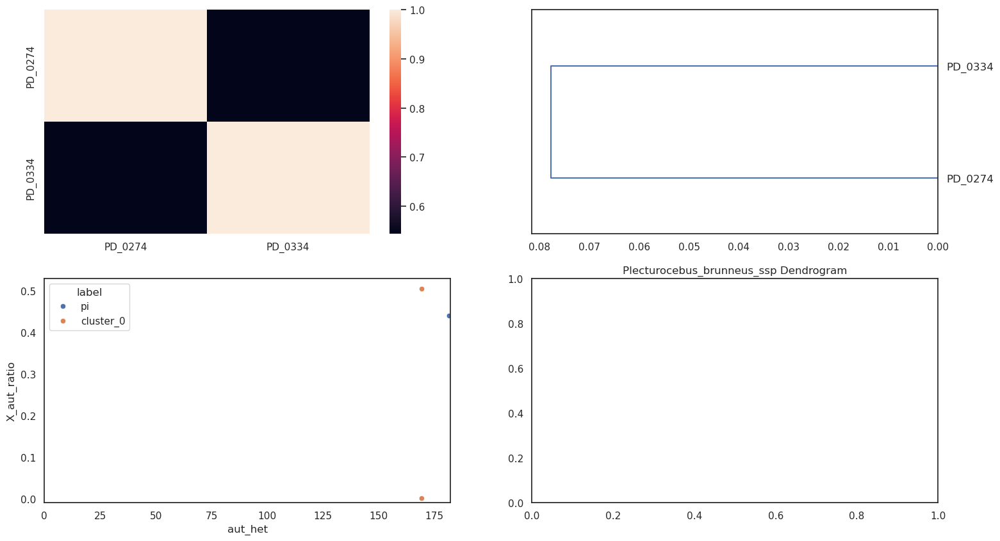

<Figure size 640x480 with 0 Axes>

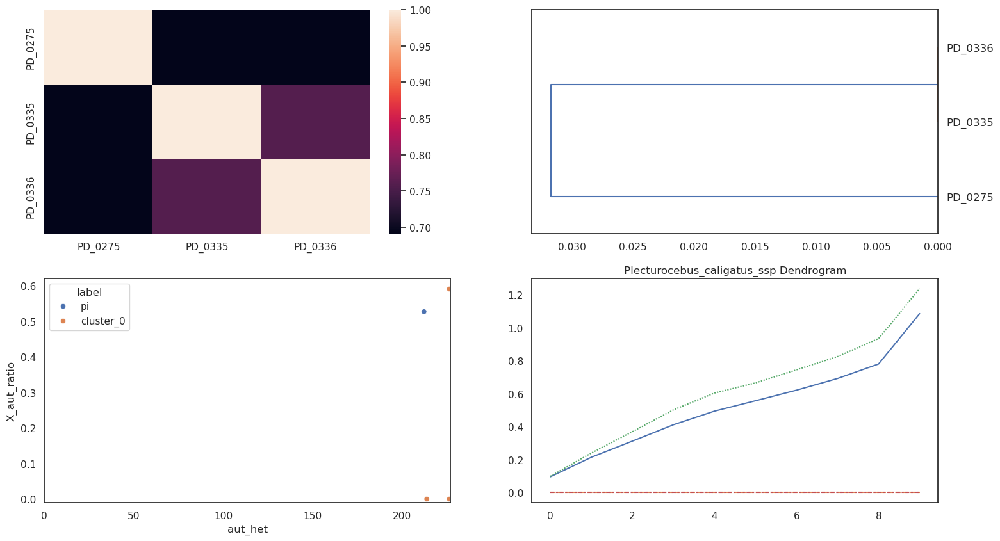

<Figure size 640x480 with 0 Axes>

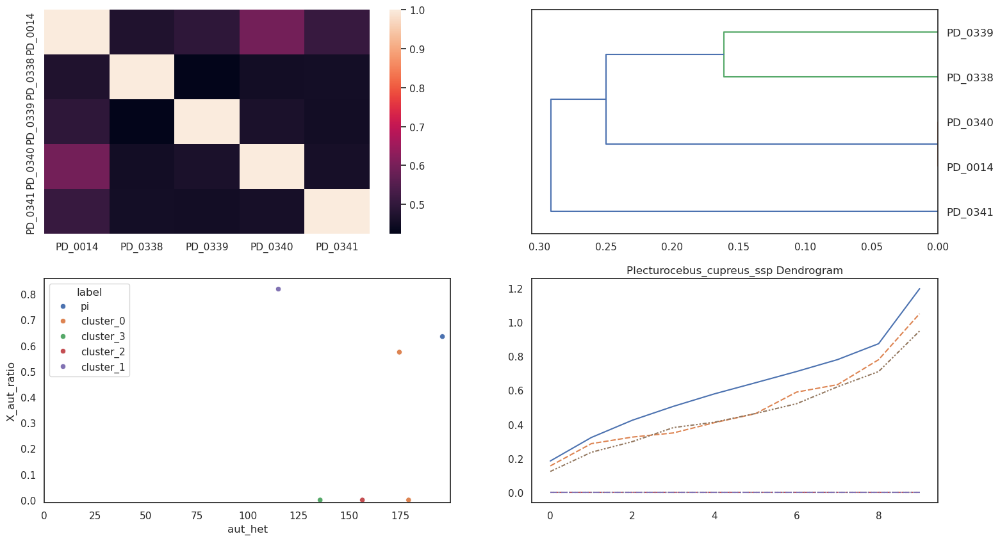

<Figure size 640x480 with 0 Axes>

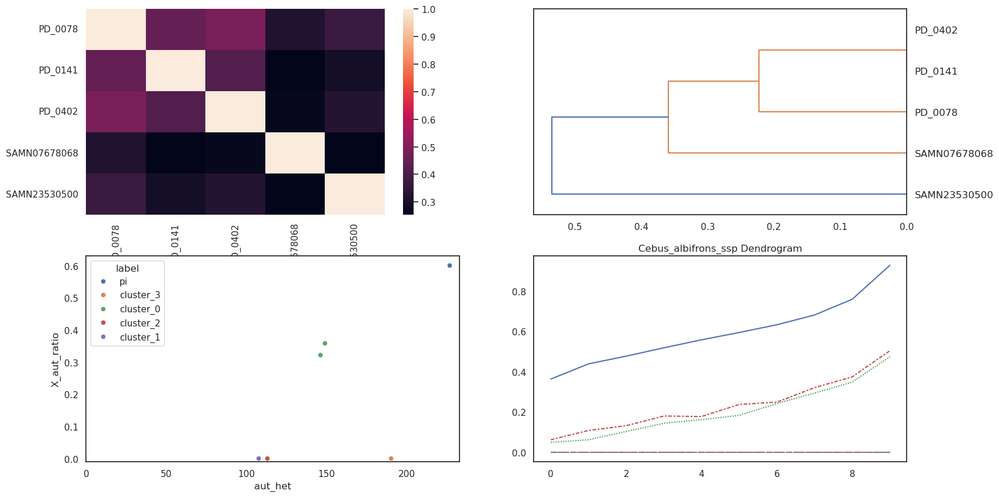

<Figure size 640x480 with 0 Axes>

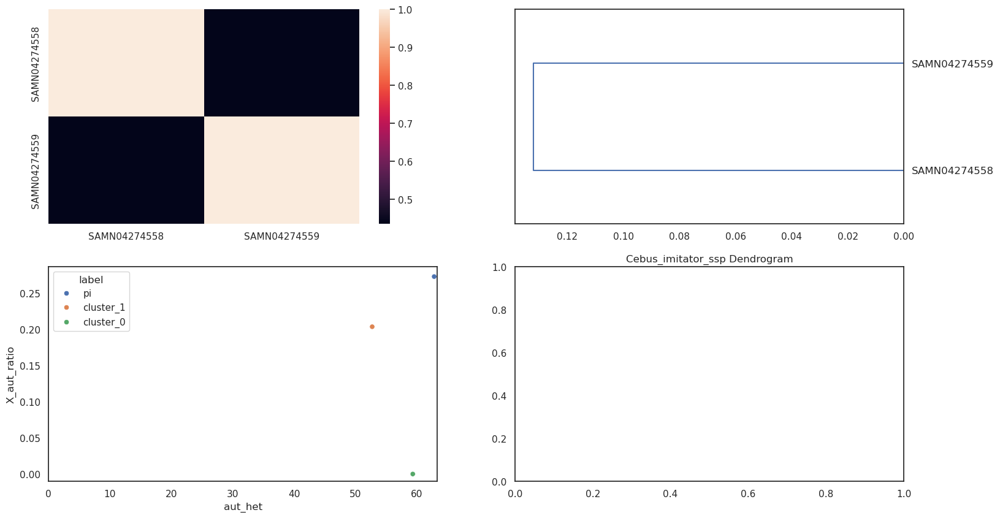

<Figure size 640x480 with 0 Axes>

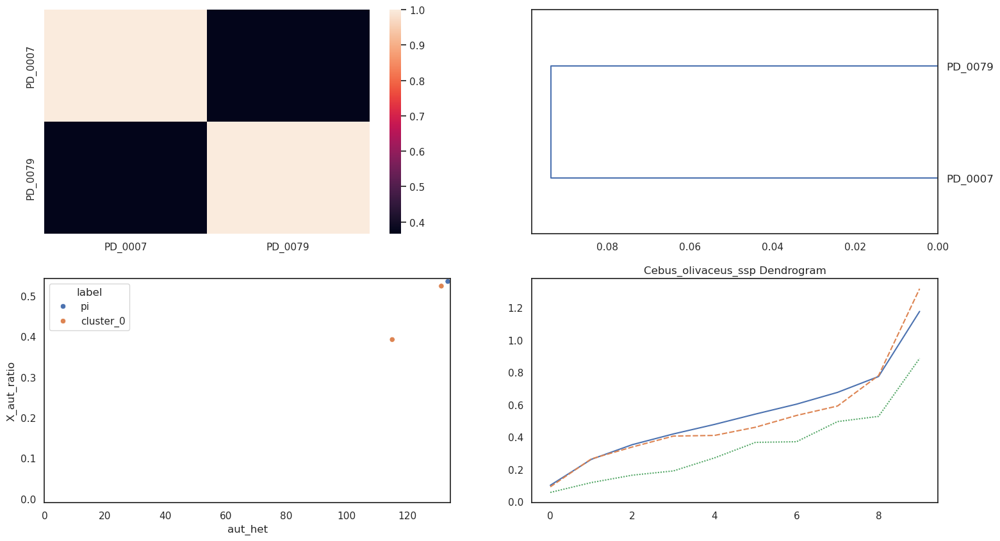

<Figure size 640x480 with 0 Axes>

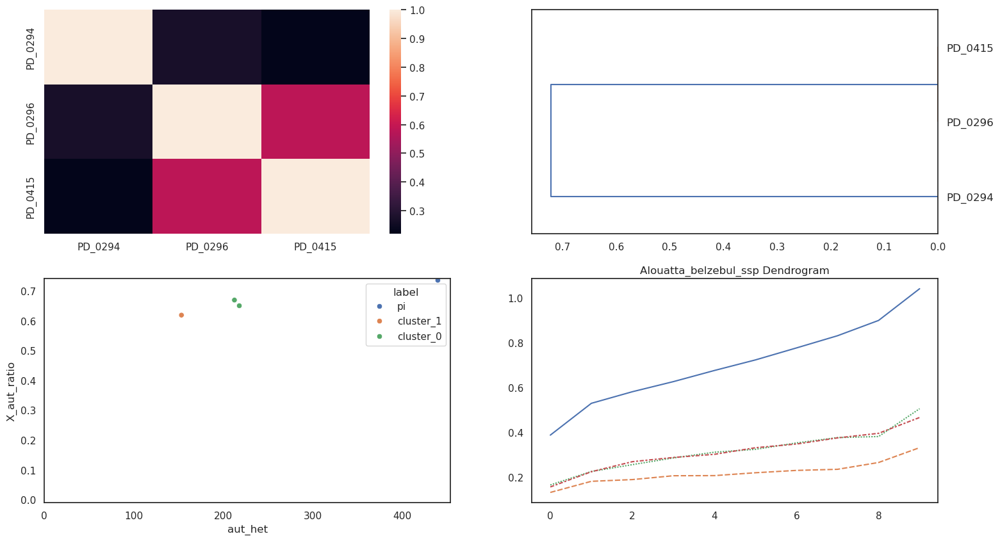

<Figure size 640x480 with 0 Axes>

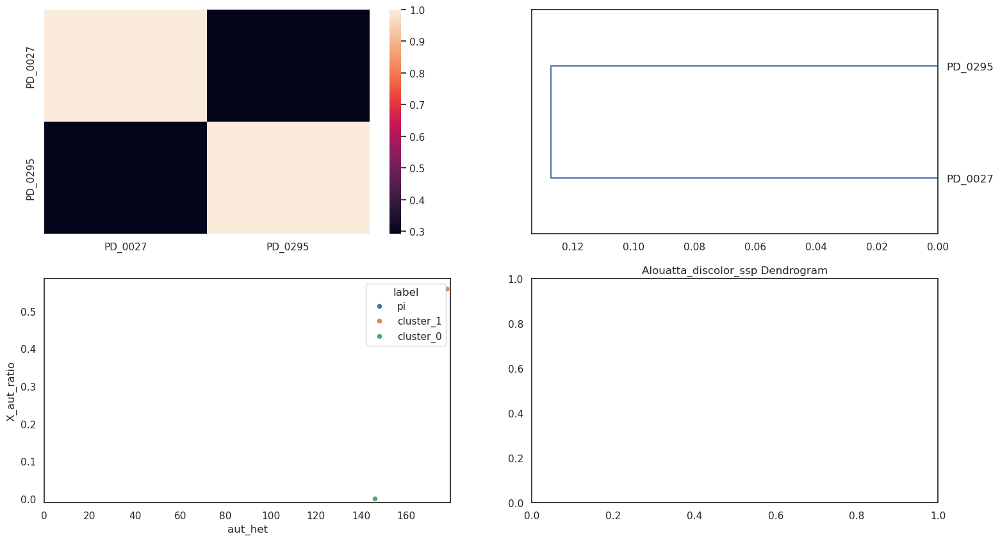

<Figure size 640x480 with 0 Axes>

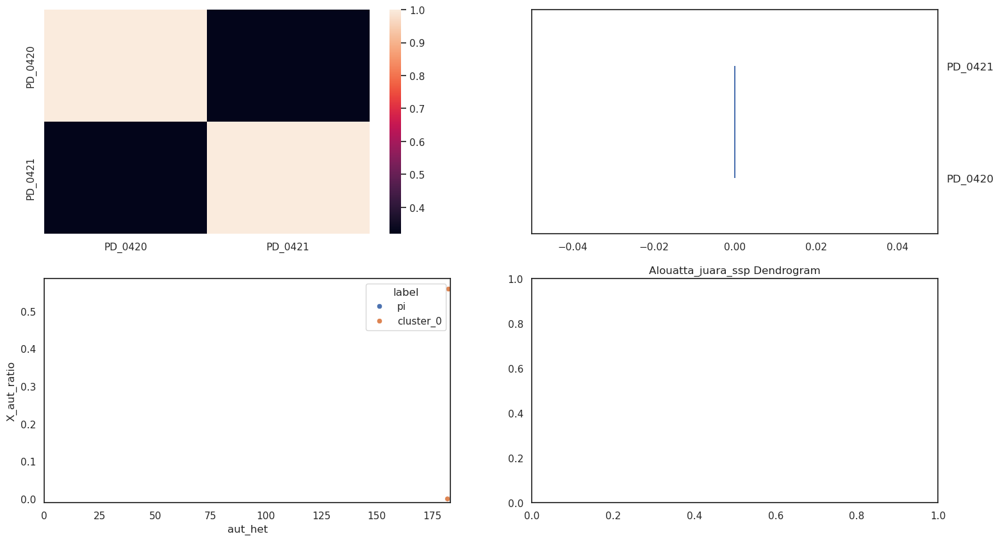

<Figure size 640x480 with 0 Axes>

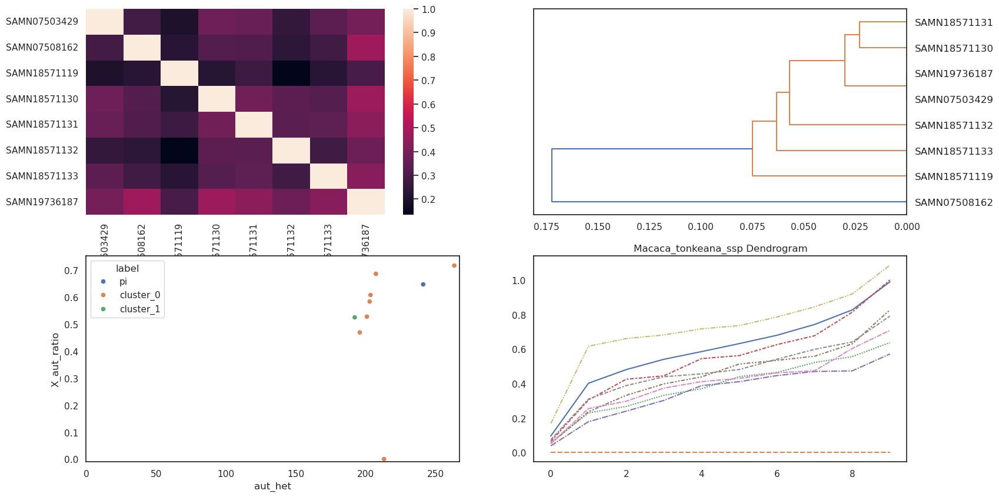

<Figure size 640x480 with 0 Axes>

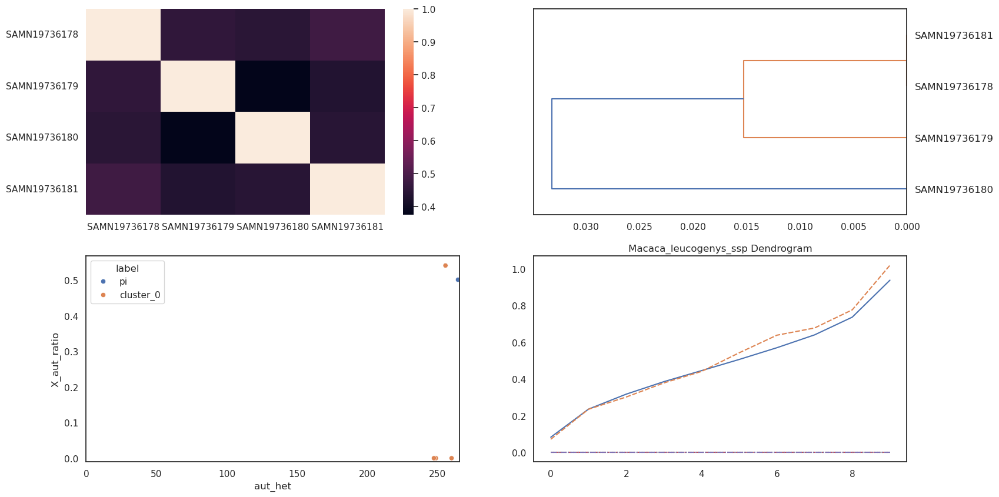

<Figure size 640x480 with 0 Axes>

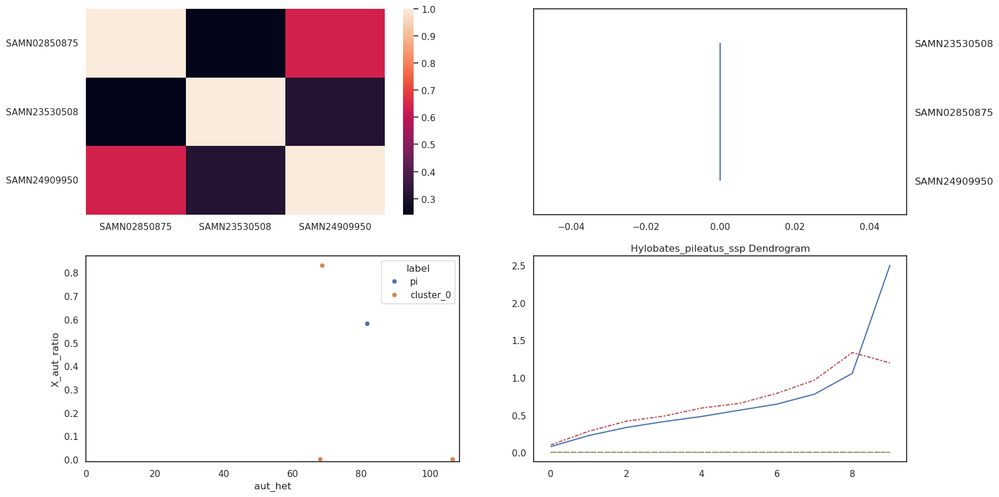

<Figure size 640x480 with 0 Axes>

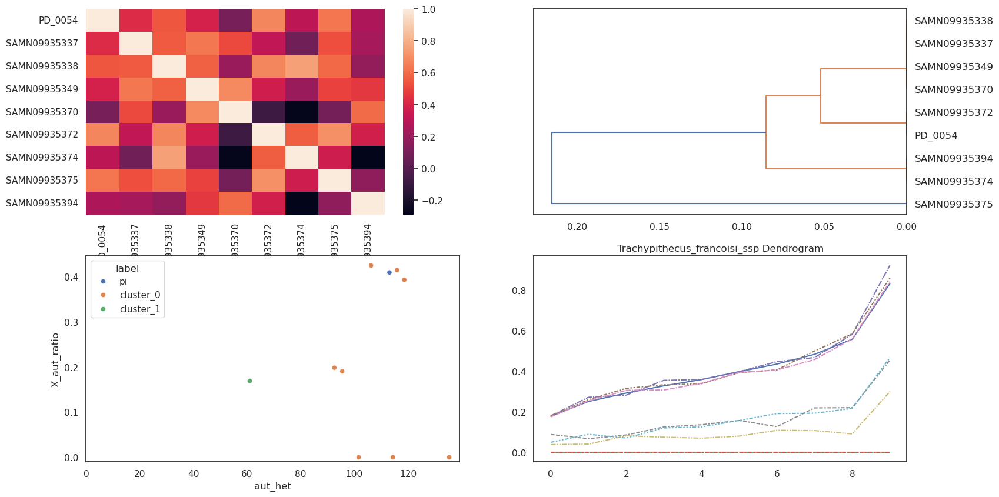

<Figure size 640x480 with 0 Axes>

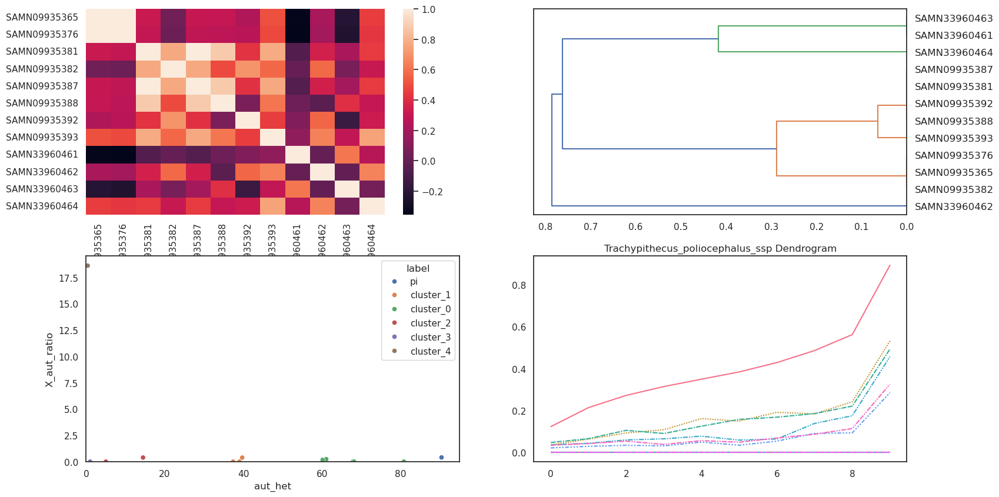

<Figure size 640x480 with 0 Axes>

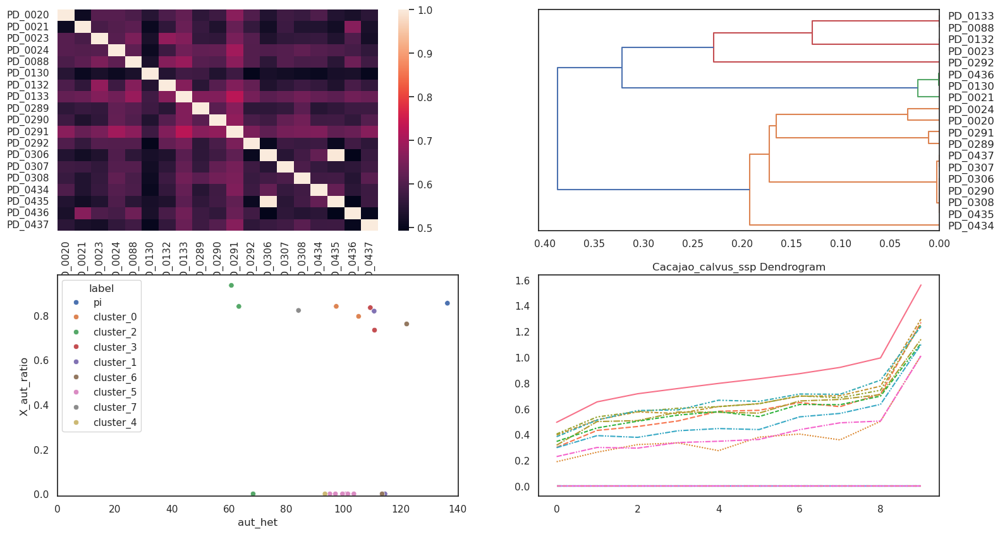

<Figure size 640x480 with 0 Axes>

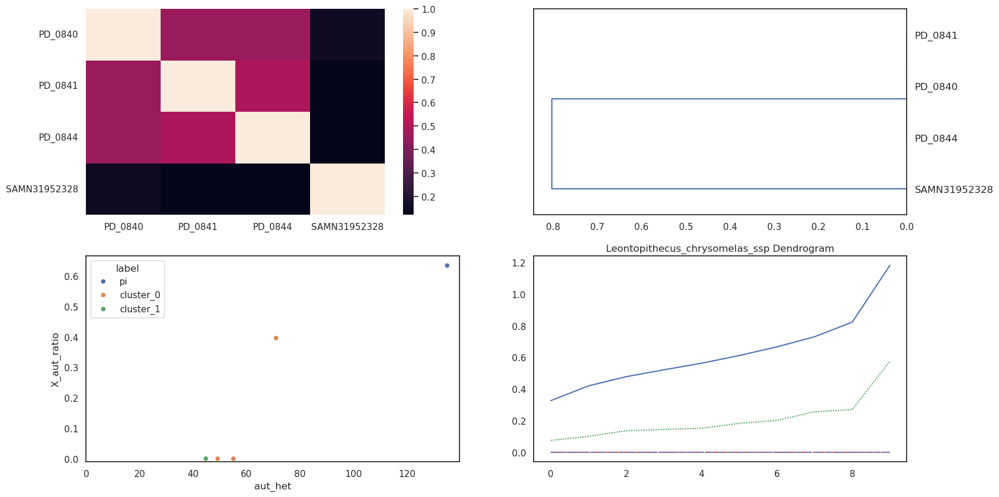

<Figure size 640x480 with 0 Axes>

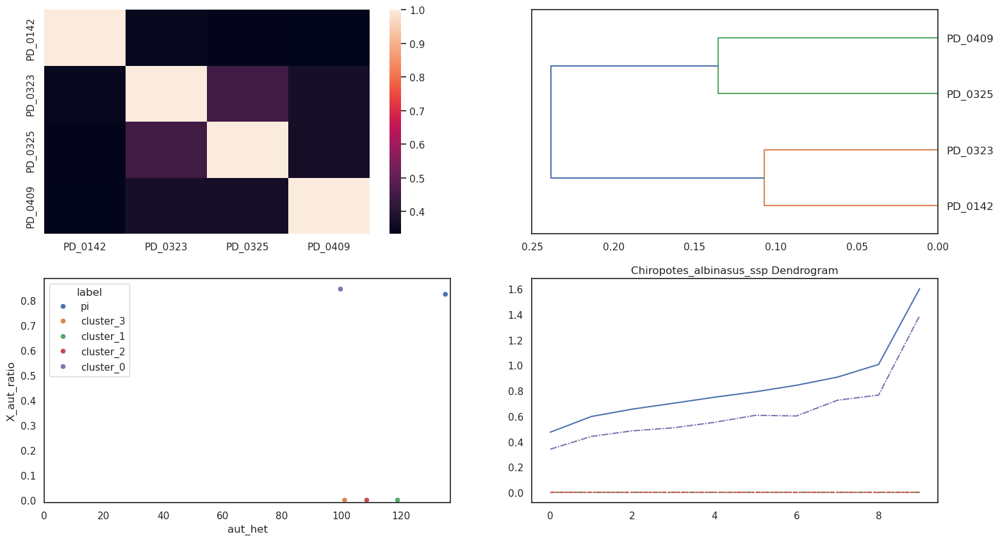

<Figure size 640x480 with 0 Axes>

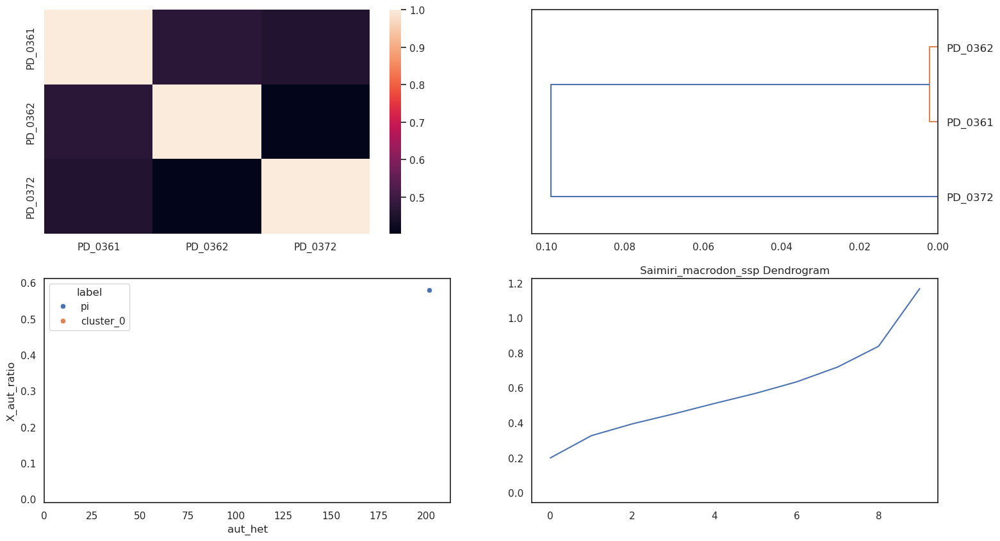

<Figure size 640x480 with 0 Axes>

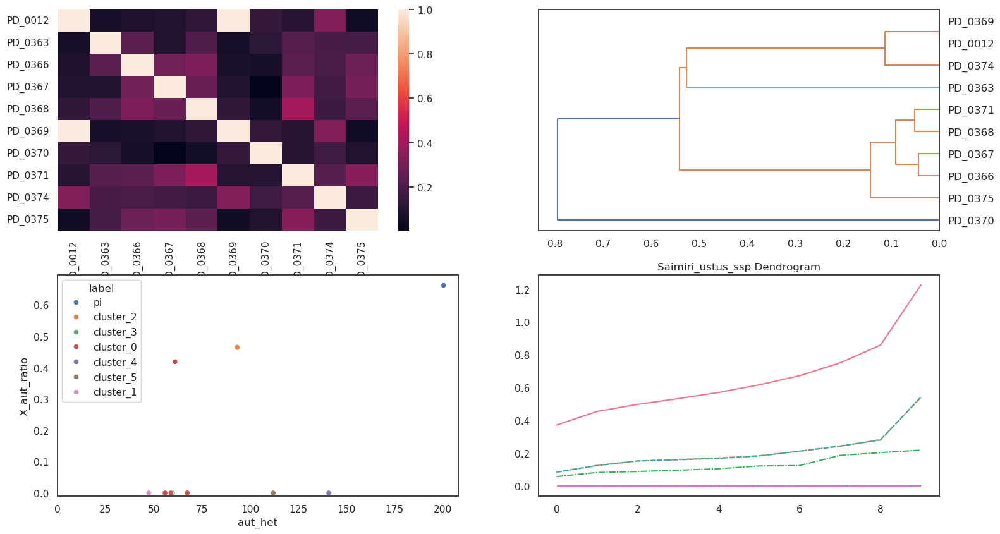

<Figure size 640x480 with 0 Axes>

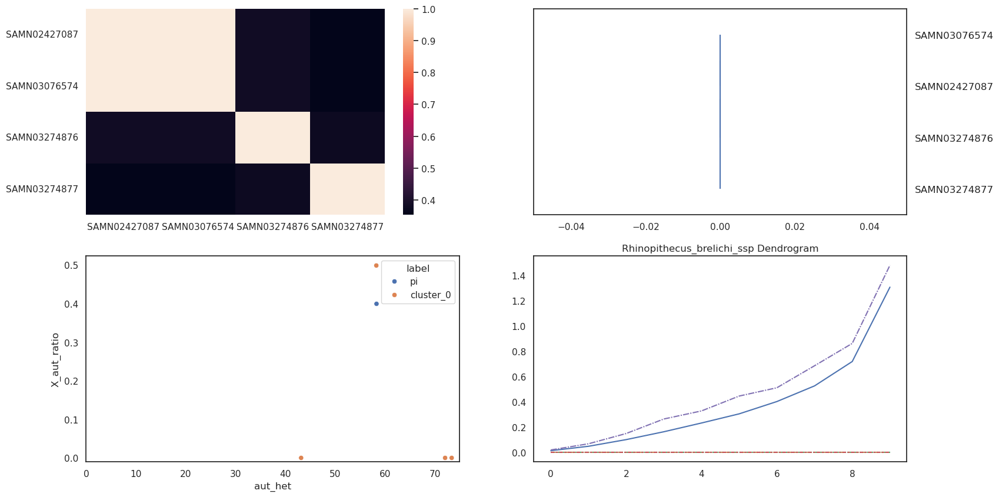

<Figure size 640x480 with 0 Axes>

In [34]:
df_lp, df_lh, df_lfst = [], [], []
for x in full_dfs:
    fig, axes = plt.subplots(2, 2, figsize=(18, 10))
    df_pi = pd.read_csv("../results/window_stats/{}_100kb_pi.txt".format(x), sep="\t", index_col=[0])
    aut_pi = df_pi.loc[(df_pi.callable_frac >= 0.75) & (df_pi.chr_type == "aut")]["pi"].mean()
    df_pi["norm_pi"] = df_pi["pi"]/aut_pi
    df_lp.append(df_pi)
    df_het = pd.read_csv("../results/window_stats/{}_100kb_het.txt".format(x), sep="\t", index_col=[0])
    df_lh.append(df_het)
    df_fst = pd.read_csv("../results/window_stats/{}_Fst.txt".format(x), sep="\t", index_col=[0])
    df_lfst.append(df_fst)
    # Clustering based on Fst
    aut_fst = df_fst.loc[(df_fst.chr_type == "Aut")]
    largest_contig = aut_fst["variants_used"].max()
    aut_fst = aut_fst.loc[(aut_fst.variants_used == largest_contig) &
                        (aut_fst["stat"] == "Fst")].iloc[:,:len(df_fst.columns)-5].fillna(0)
    model = AgglomerativeClustering(distance_threshold=0.1, n_clusters=None, metric="precomputed", linkage="average")
    model = model.fit(aut_fst.clip(0))
    plt.title("{} Dendrogram".format(x))
    plot_dendrogram(model, truncate_mode="level", p=10, ax=axes[0, 1])
    plt.figure()
    # Heatmap of autosomal landscape correlation.
    sns.heatmap(df_het.loc[(df_het.chr_type == "aut") &
          (df_het.callable_frac >= 0.75)].iloc[:,:len(df_fst.columns)-5].corr(), ax=axes[0, 0])
    # X autosome ratio
    df_het.insert(0, "pi", df_pi.pi)
    ratio_df = df_het.loc[df_het.callable_frac >= 0.75].groupby(["chr_type"])[df_het.iloc[:,:-6].columns].mean().reset_index()
    long_df = pd.melt(ratio_df, id_vars = "chr_type", var_name='sample_ID', value_name='aut_het')
    x_aut_df = long_df.loc[long_df.chr_type == "aut"].reset_index()
    x_aut_df["X_aut_ratio"] = long_df.loc[long_df.chr_type == "chrX"].reset_index().aut_het/x_aut_df.aut_het
    label_map = {}
    label_map["pi"] = "pi"
    for i in range(len(model.labels_)):
        label_map[df_het.columns[i+1]] = "cluster_{}".format(model.labels_[i])
    x_aut_df["label"] = x_aut_df.sample_ID.map(label_map)
    g = sns.scatterplot(x_aut_df, x="aut_het", y="X_aut_ratio", ax=axes[1, 0], hue="label")
    g.set(xlim=(-0.01, None), ylim=(-0.01, None))
    df_het_aut = df_het.loc[df_het.chr_type == "chrX"].copy()
    if df_het_aut.pi.isna().sum()/len(df_het_aut) < 0.5:
        df_het_aut["quantile_bin"] = pd.qcut(df_het_aut["pi"], 10, duplicates="drop")
        df_x_frac = df_het_aut.groupby(["quantile_bin"], observed=True)[df_het_aut.columns[:-7]].mean()/x_aut_df.aut_het[0]
        sns.lineplot(data=df_x_frac.reset_index(), legend=False, ax=axes[1, 1])
    plt.tight_layout()

/tmp/5030218/ipykernel_85743/3891066315.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 2, figsize=(18, 10))
/home/eriks/miniconda3/envs/primatediversity2/lib/python3.12/site-packages/scipy/cluster/hierarchy.py:2978: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim([dvw, 0])
/home/eriks/miniconda3/envs/primatediversity2/lib/python3.12/site-packages/scipy/cluster/hierarchy.py:2978: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim([dvw, 0])
/home/eriks/miniconda3/envs/primatediversity2/lib/python3.12/site-packages/scipy/cluster/hiera

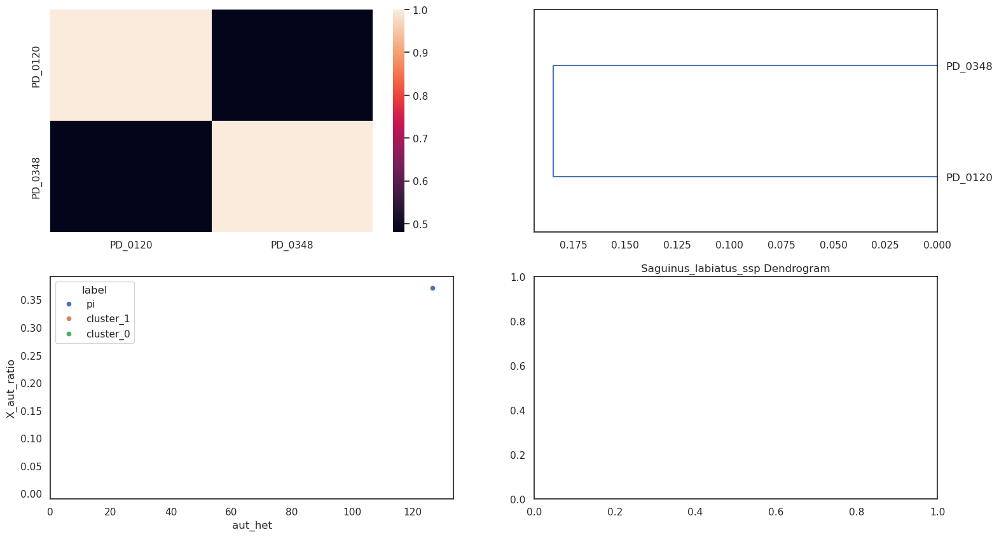

<Figure size 640x480 with 0 Axes>

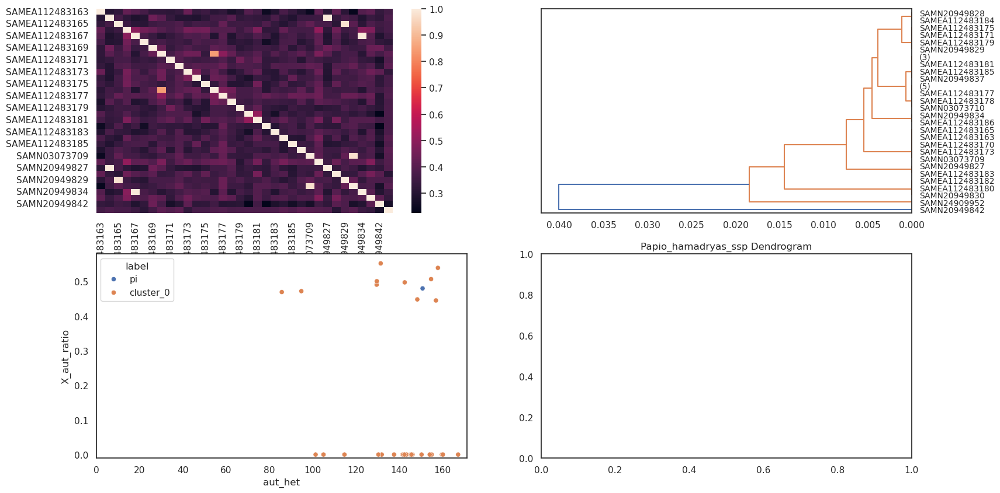

<Figure size 640x480 with 0 Axes>

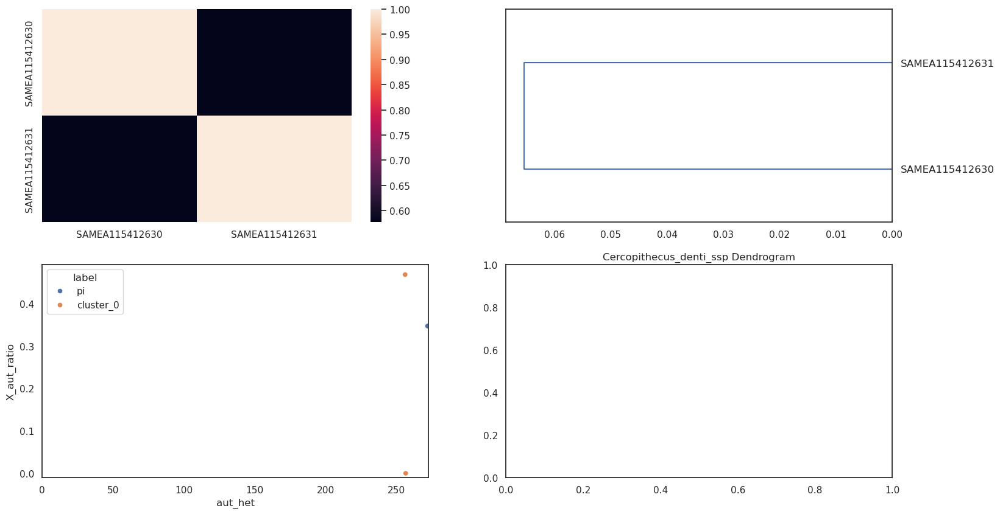

<Figure size 640x480 with 0 Axes>

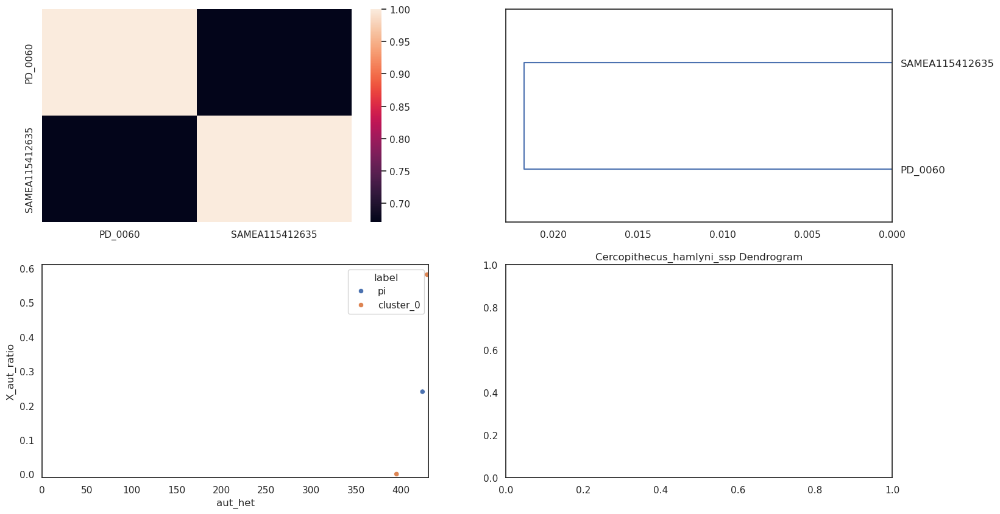

<Figure size 640x480 with 0 Axes>

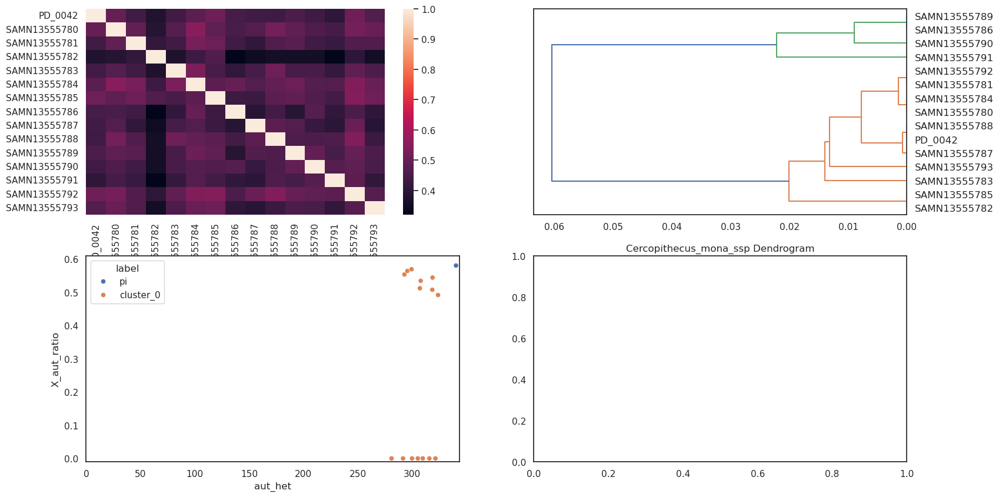

<Figure size 640x480 with 0 Axes>

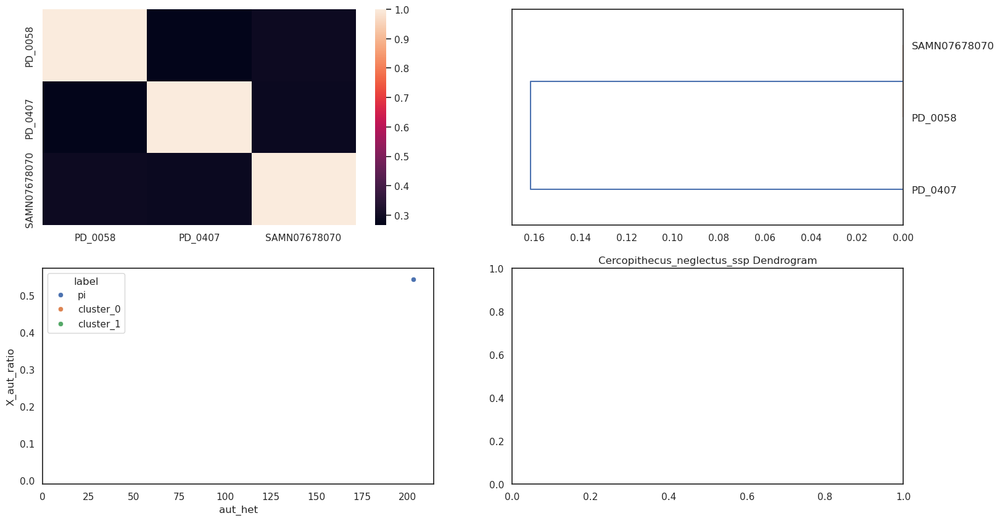

<Figure size 640x480 with 0 Axes>

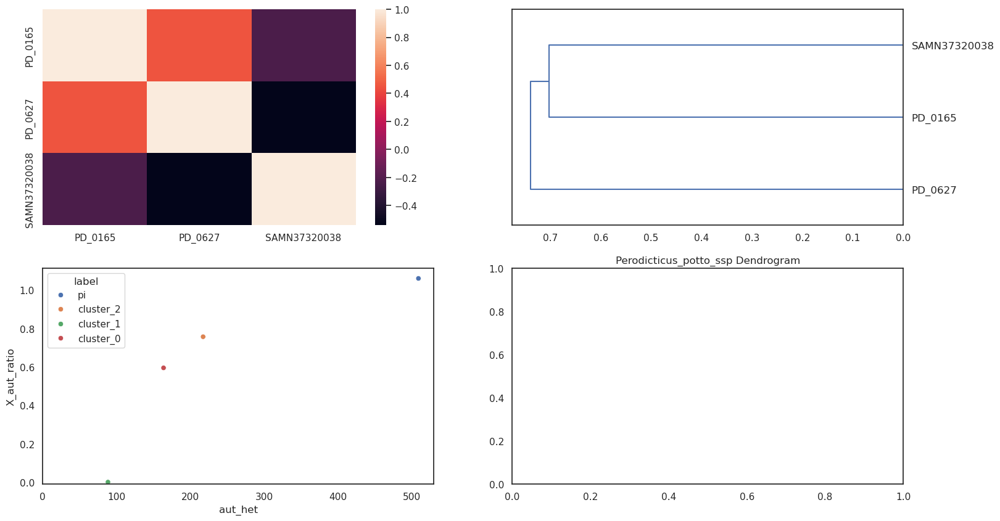

<Figure size 640x480 with 0 Axes>

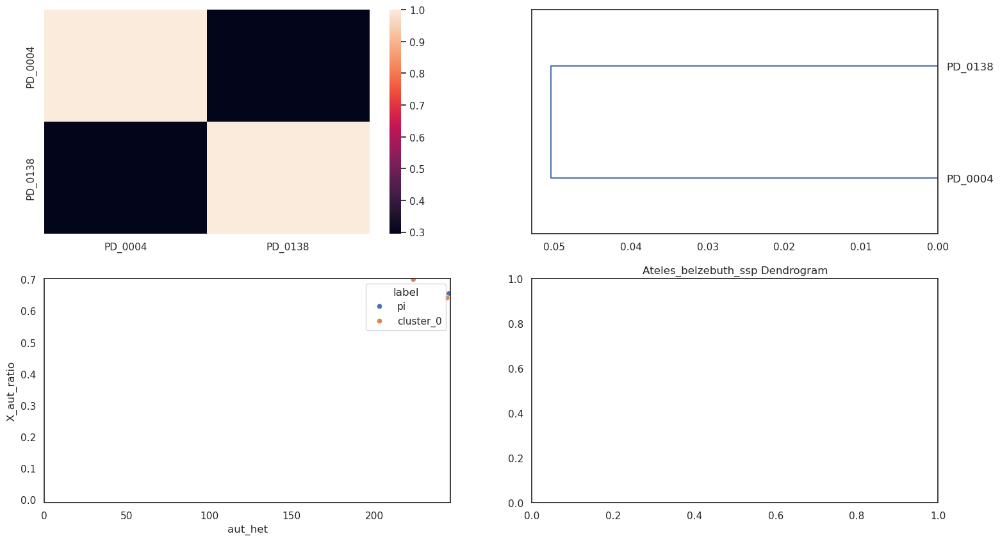

<Figure size 640x480 with 0 Axes>

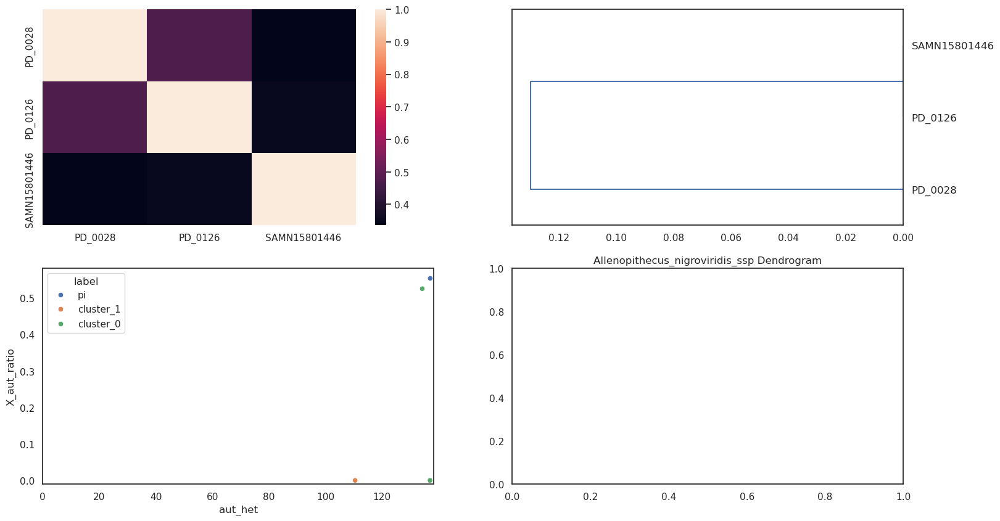

<Figure size 640x480 with 0 Axes>

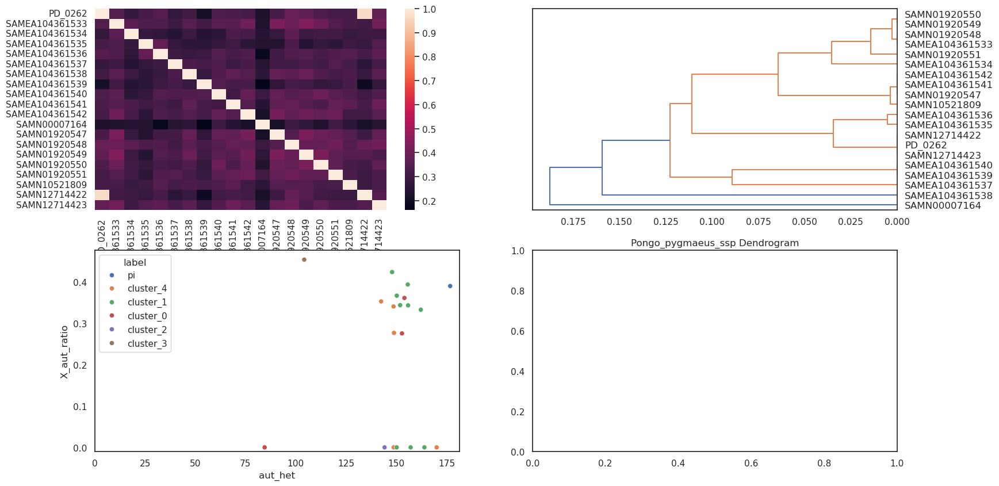

<Figure size 640x480 with 0 Axes>

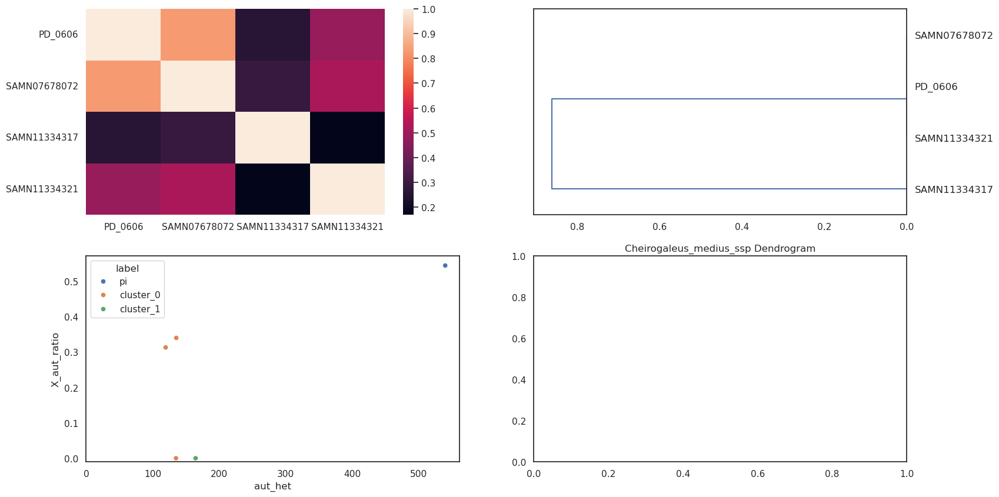

<Figure size 640x480 with 0 Axes>

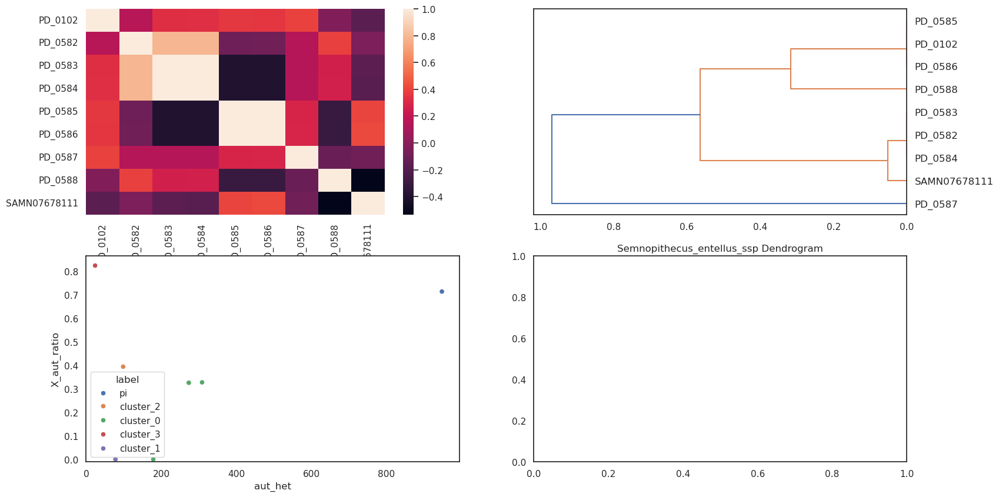

<Figure size 640x480 with 0 Axes>

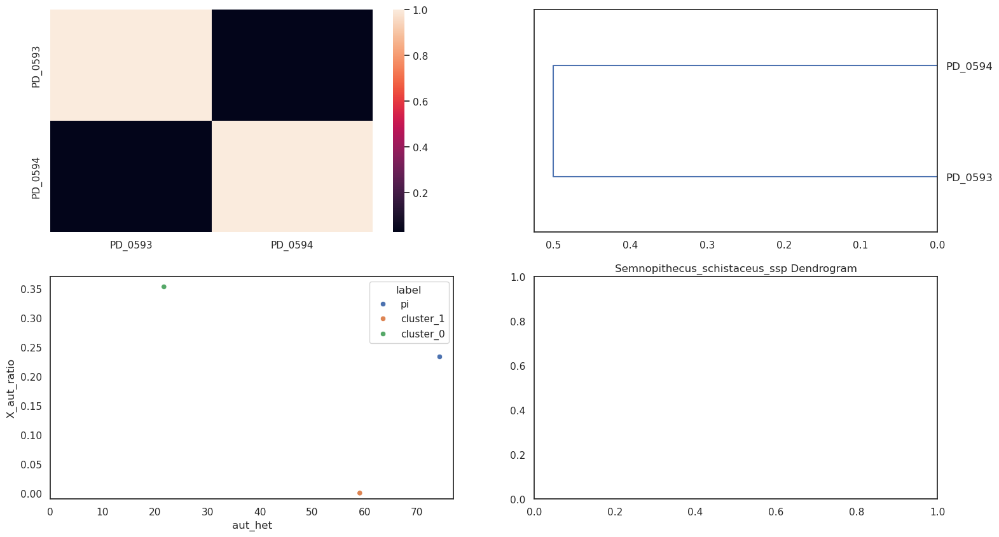

<Figure size 640x480 with 0 Axes>

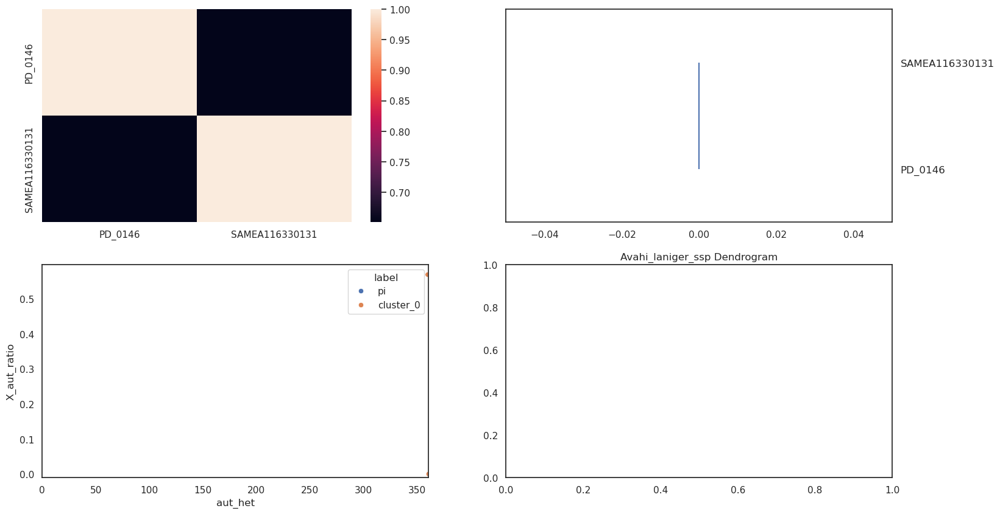

<Figure size 640x480 with 0 Axes>

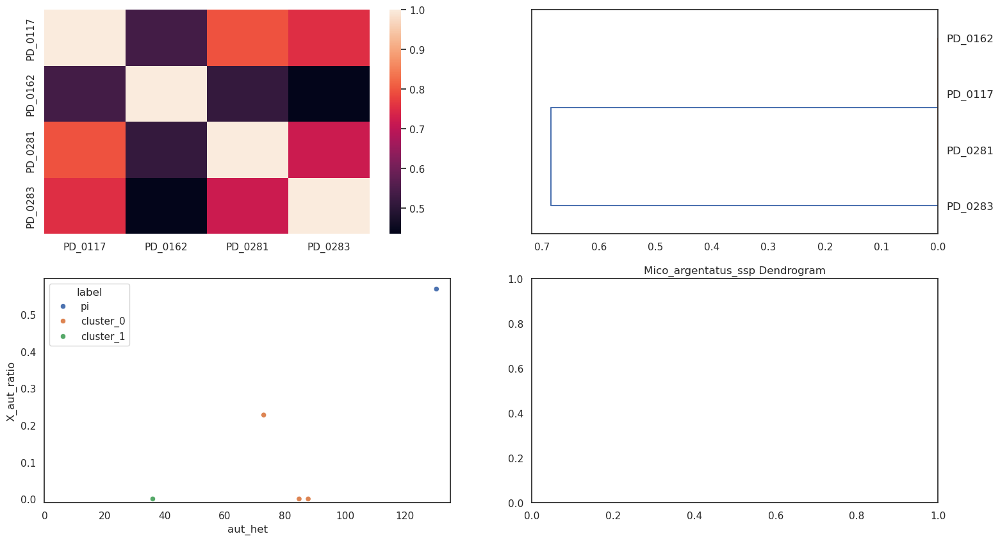

<Figure size 640x480 with 0 Axes>

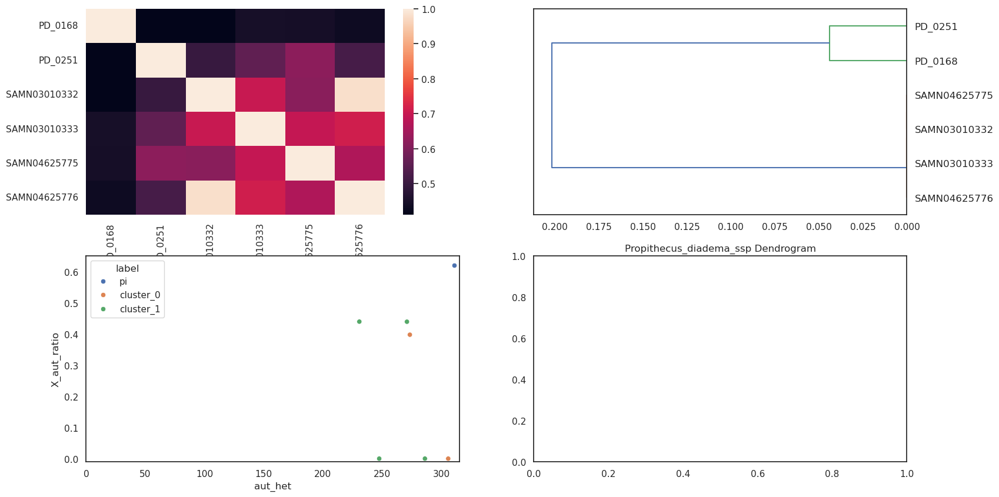

<Figure size 640x480 with 0 Axes>

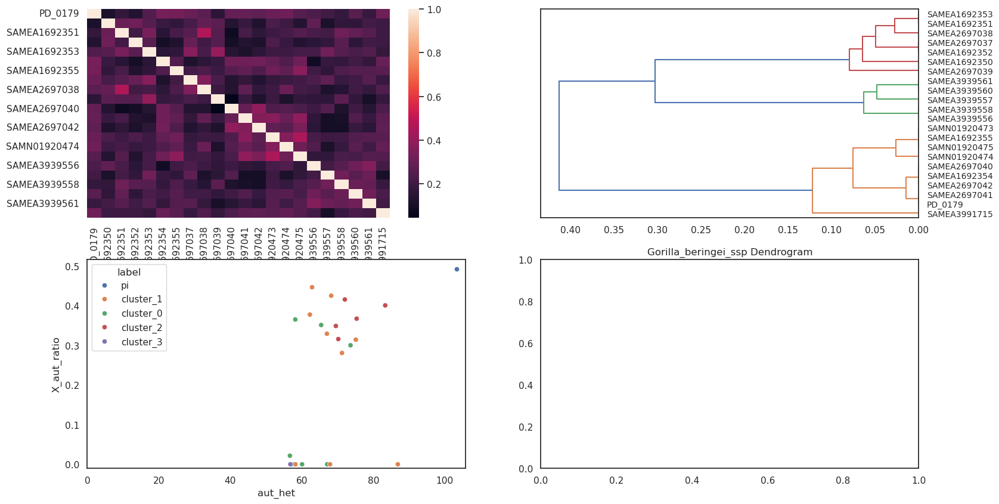

<Figure size 640x480 with 0 Axes>

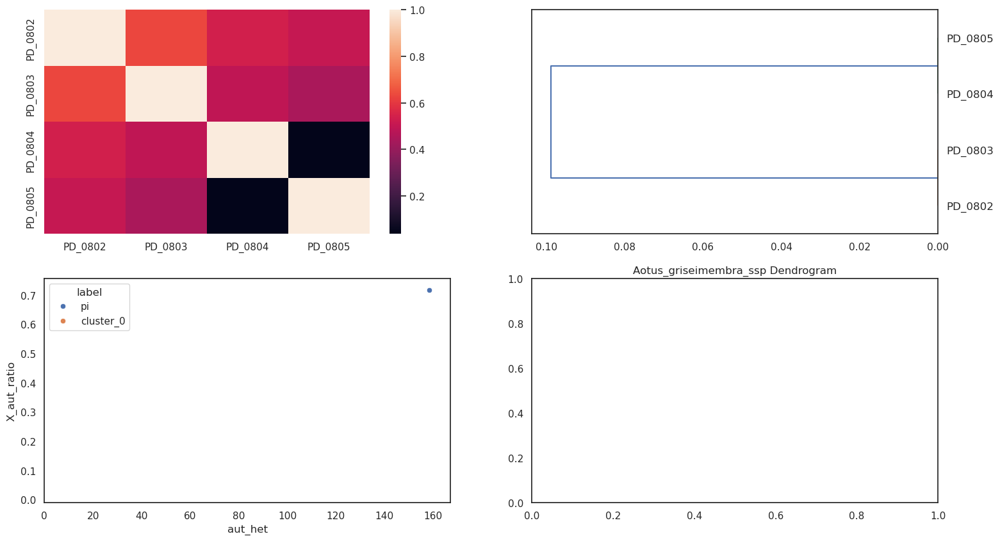

<Figure size 640x480 with 0 Axes>

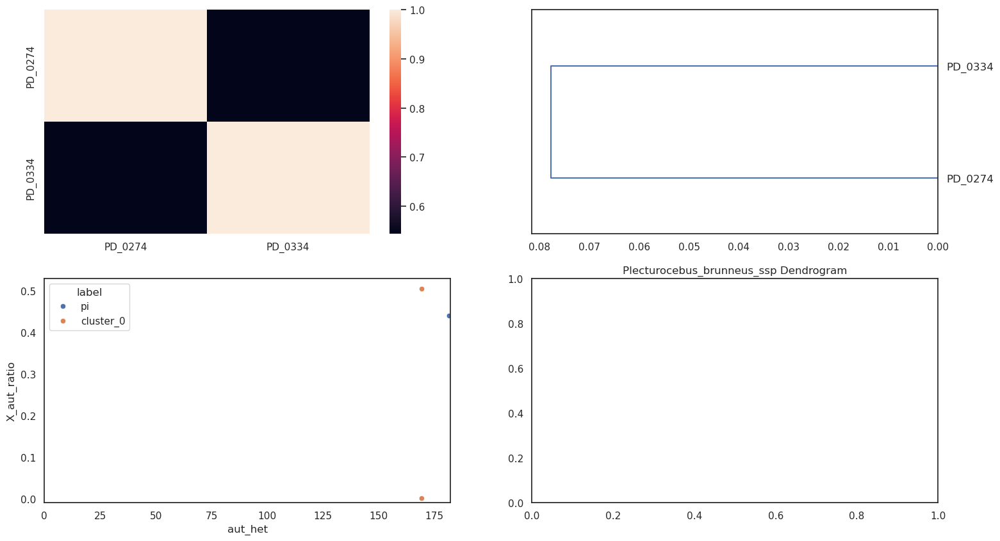

<Figure size 640x480 with 0 Axes>

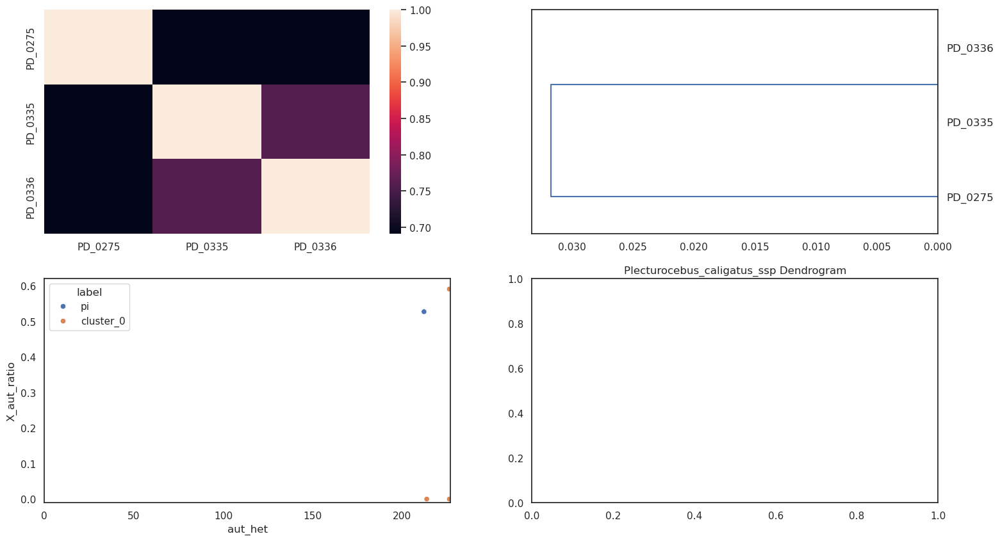

<Figure size 640x480 with 0 Axes>

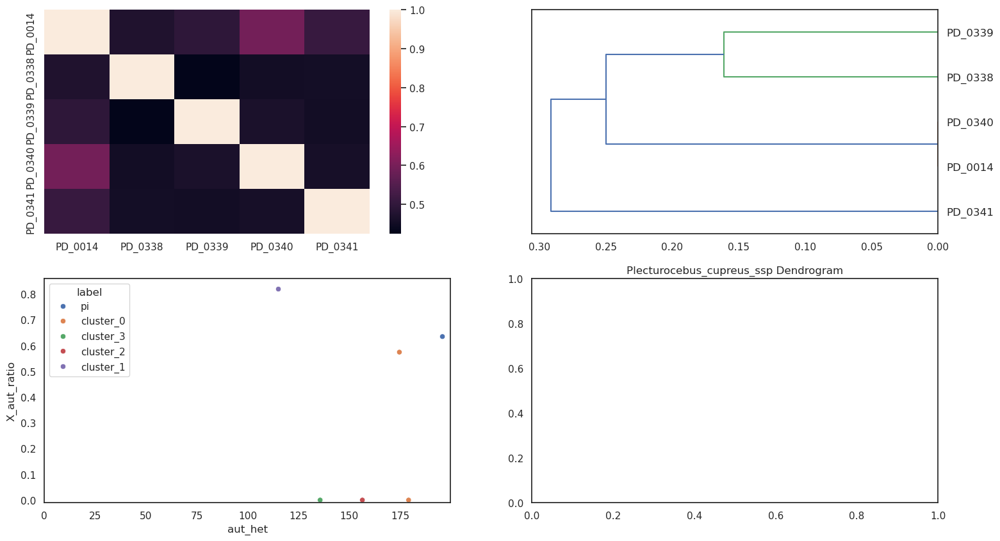

<Figure size 640x480 with 0 Axes>

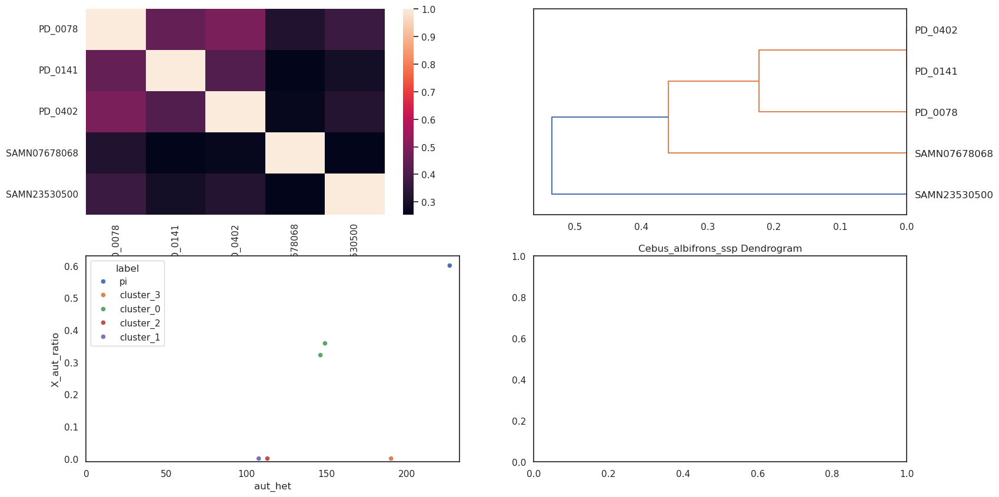

<Figure size 640x480 with 0 Axes>

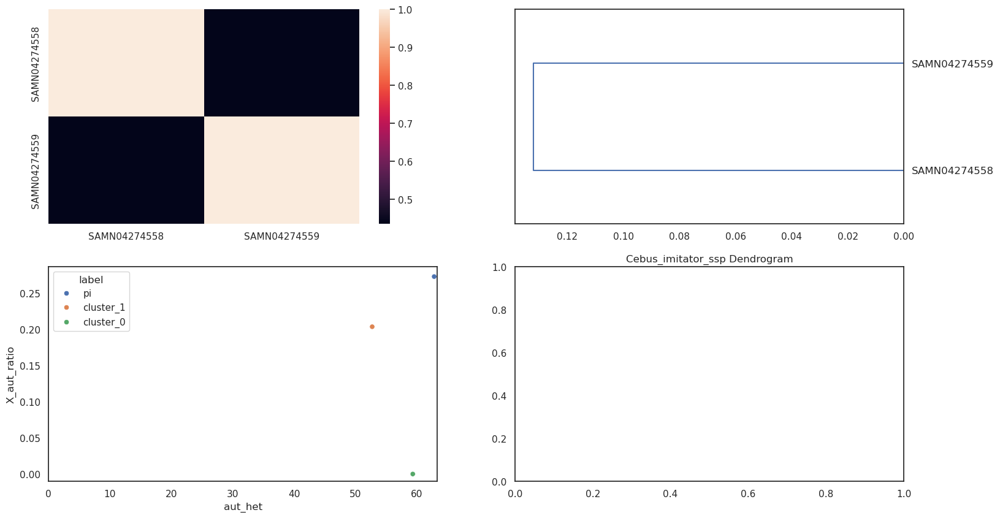

<Figure size 640x480 with 0 Axes>

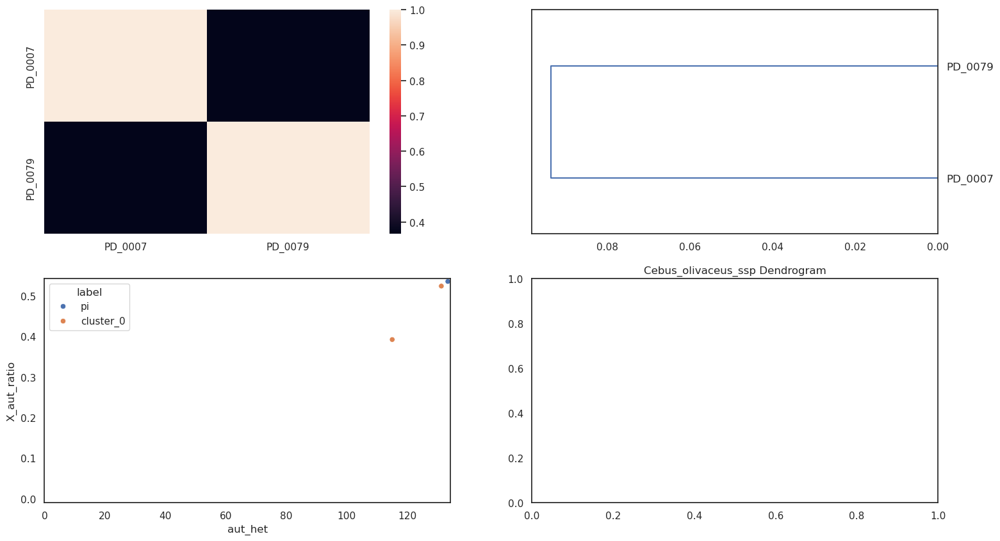

<Figure size 640x480 with 0 Axes>

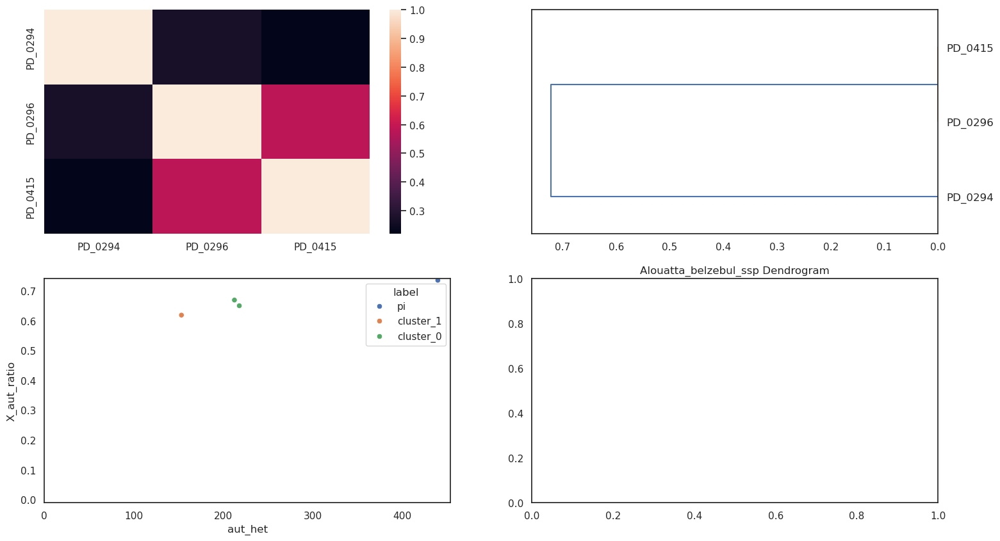

<Figure size 640x480 with 0 Axes>

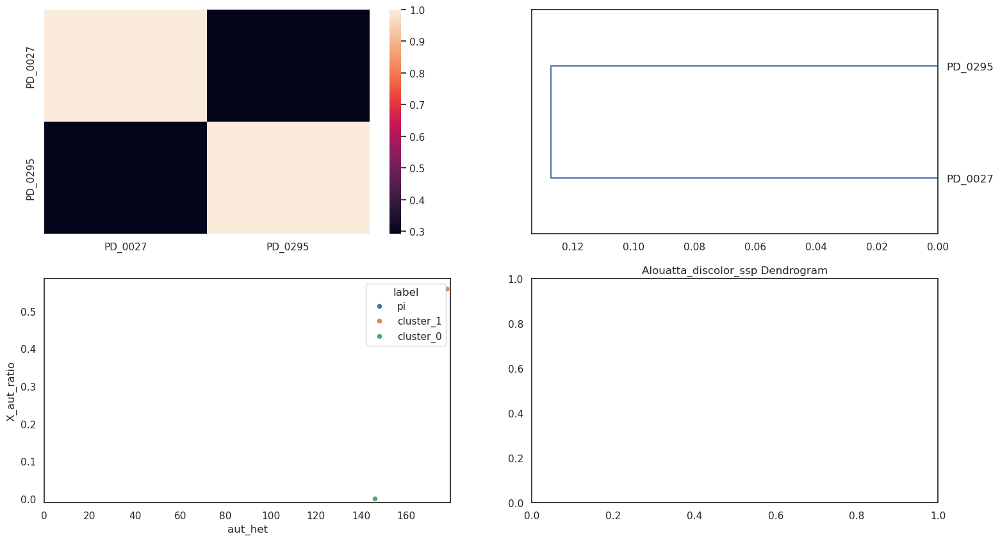

<Figure size 640x480 with 0 Axes>

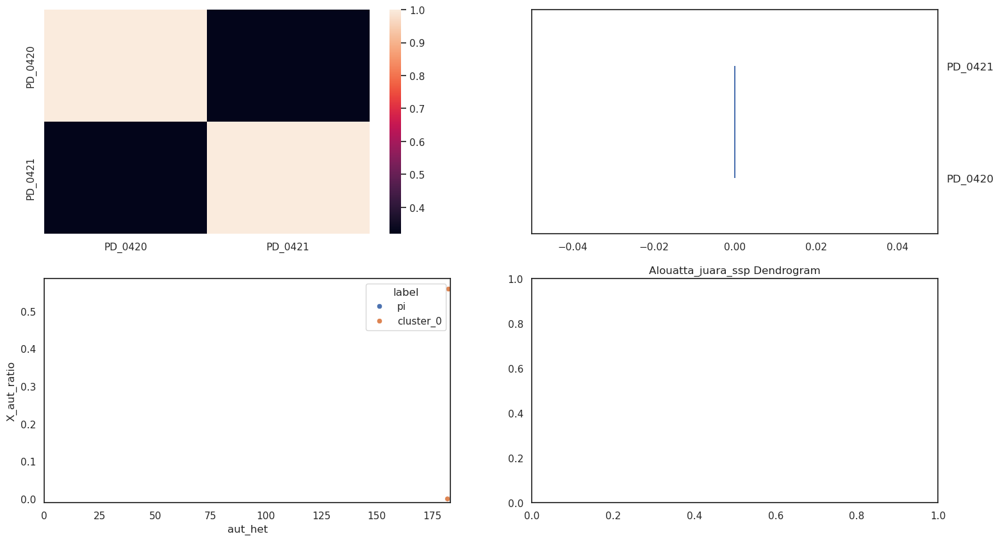

<Figure size 640x480 with 0 Axes>

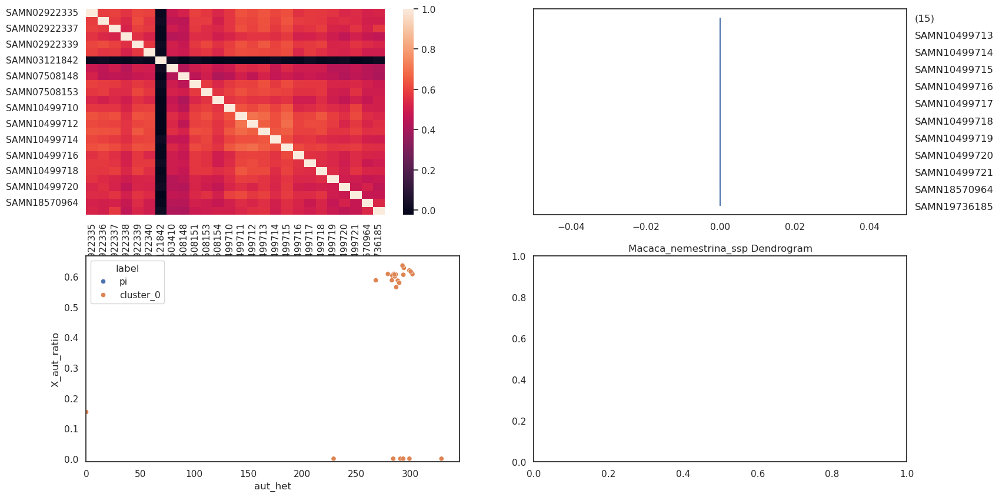

<Figure size 640x480 with 0 Axes>

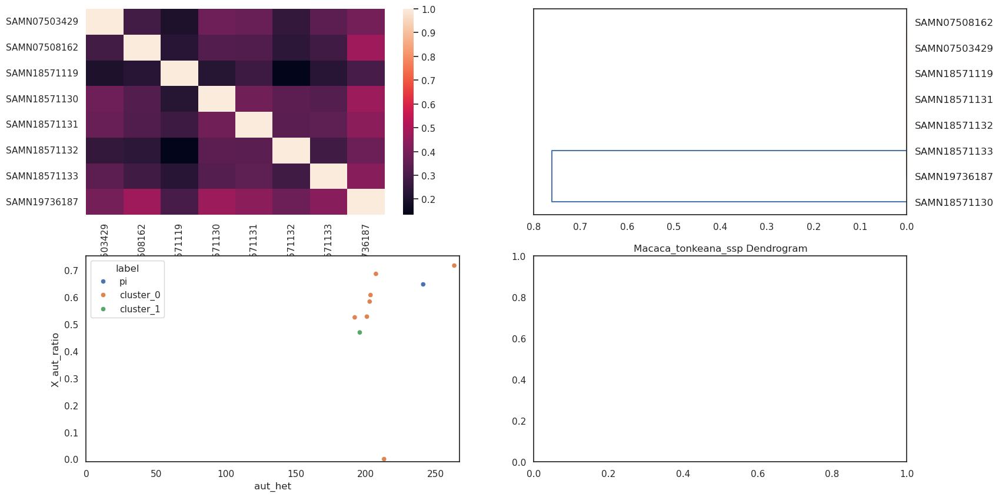

<Figure size 640x480 with 0 Axes>

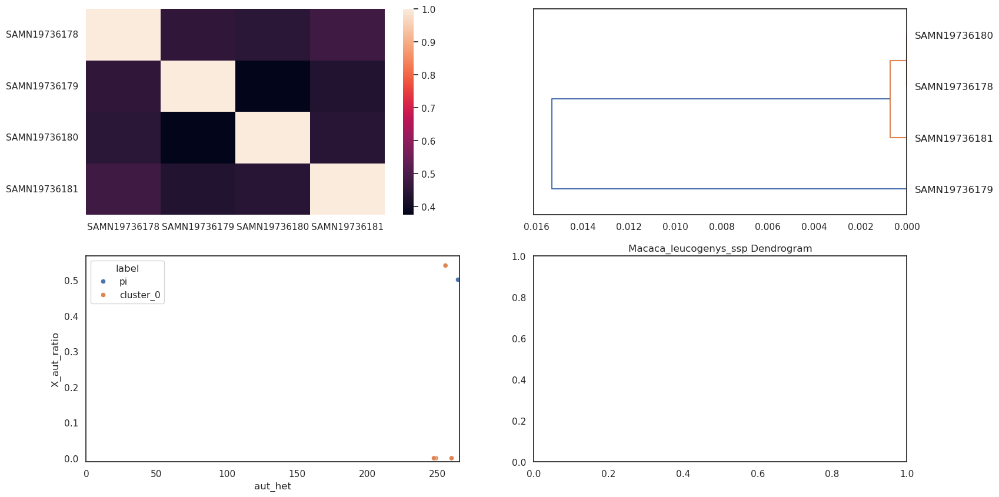

<Figure size 640x480 with 0 Axes>

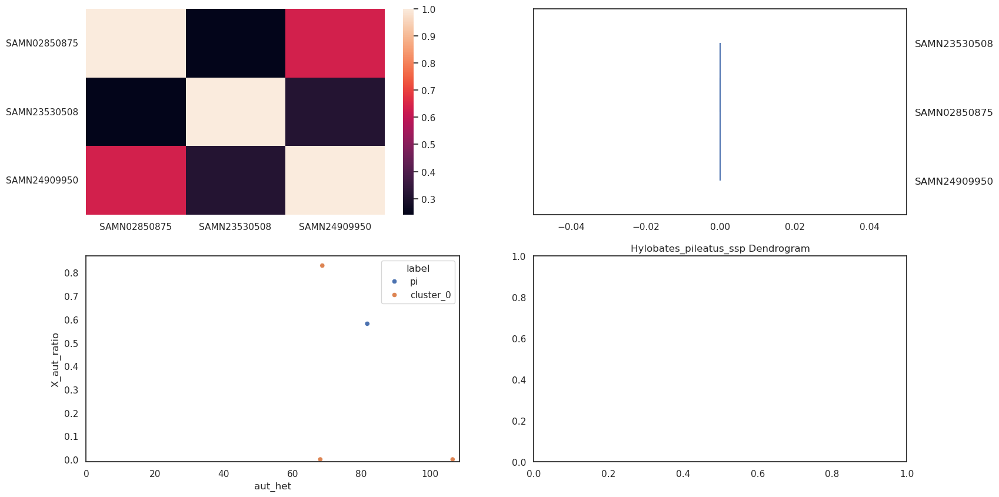

<Figure size 640x480 with 0 Axes>

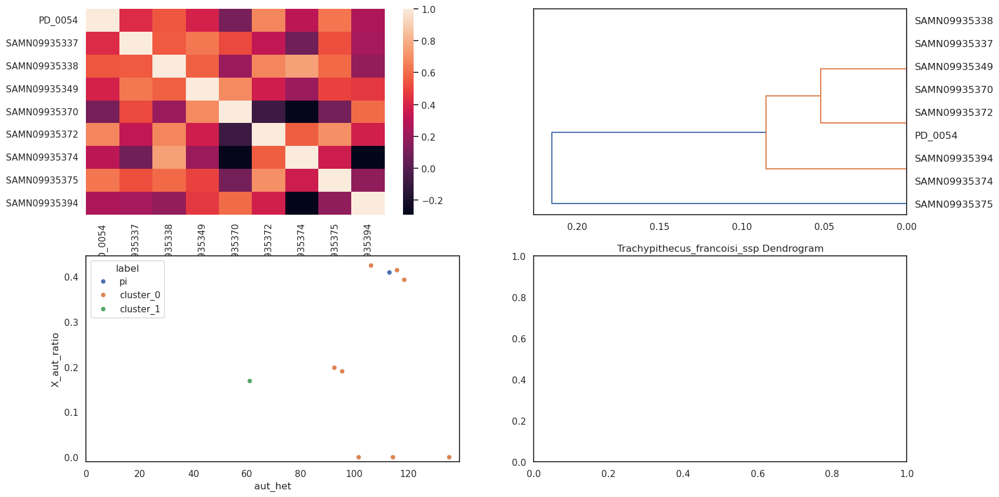

<Figure size 640x480 with 0 Axes>

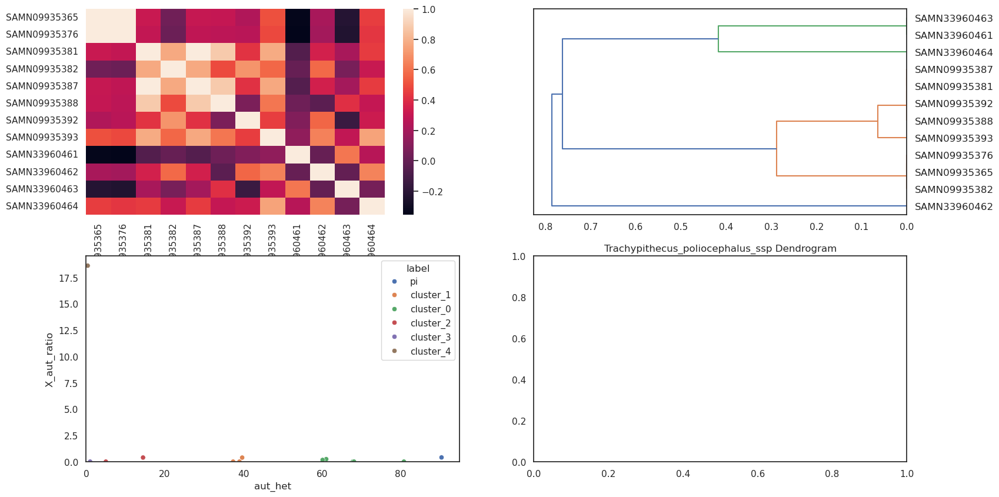

<Figure size 640x480 with 0 Axes>

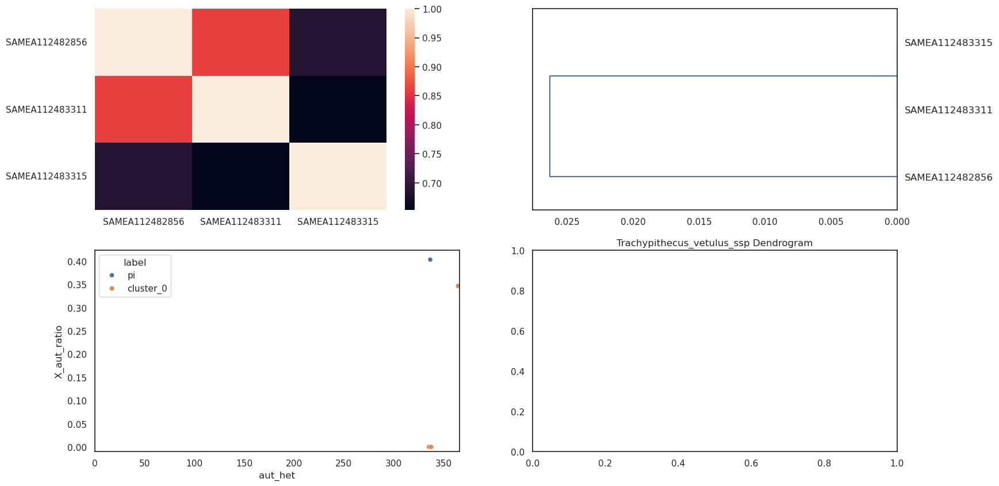

<Figure size 640x480 with 0 Axes>

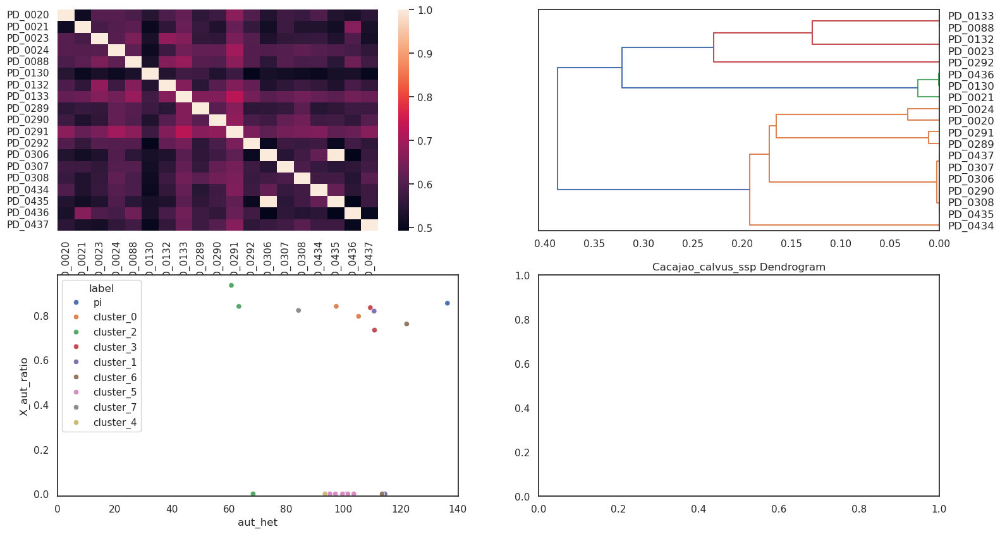

<Figure size 640x480 with 0 Axes>

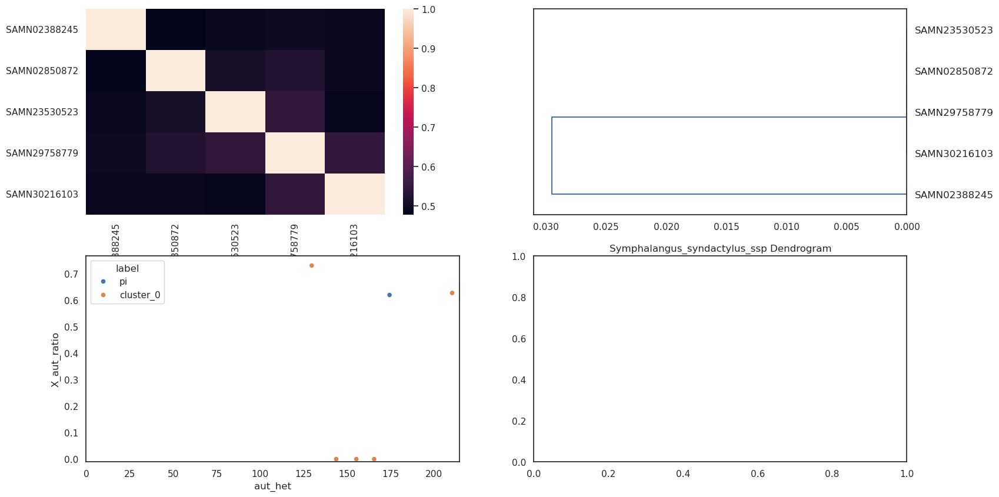

<Figure size 640x480 with 0 Axes>

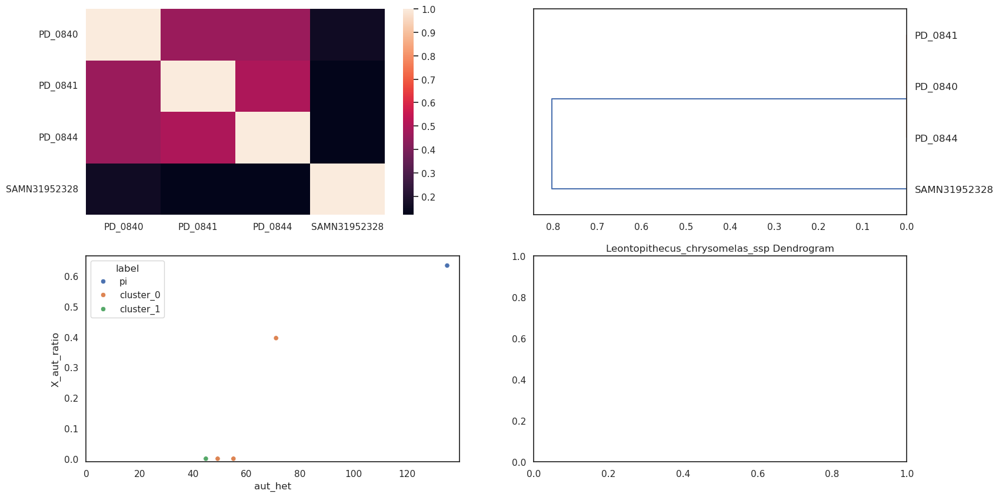

<Figure size 640x480 with 0 Axes>

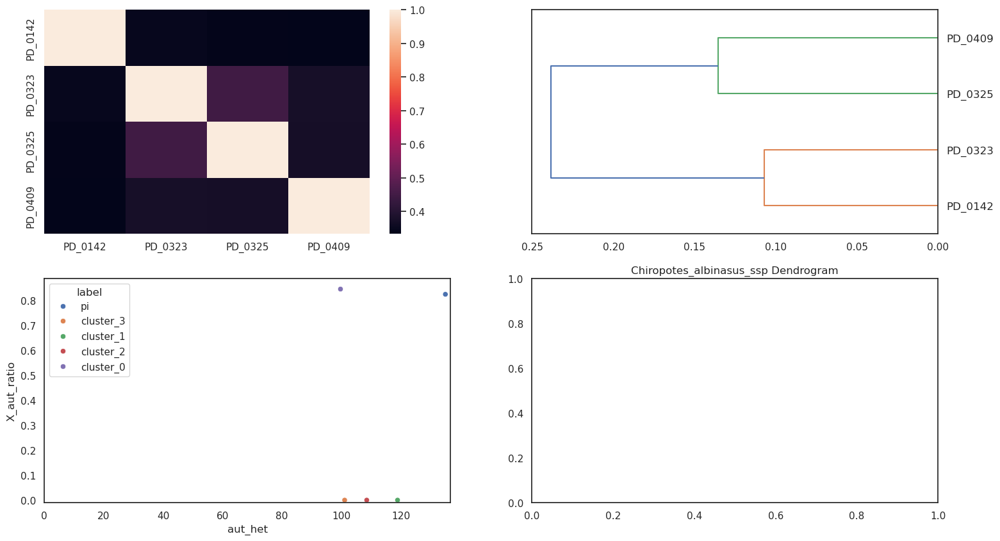

<Figure size 640x480 with 0 Axes>

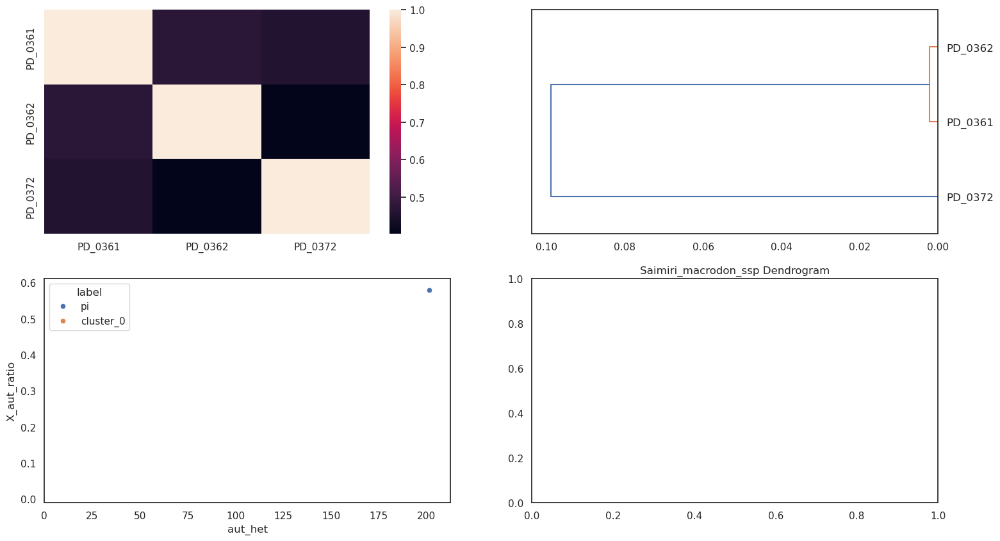

<Figure size 640x480 with 0 Axes>

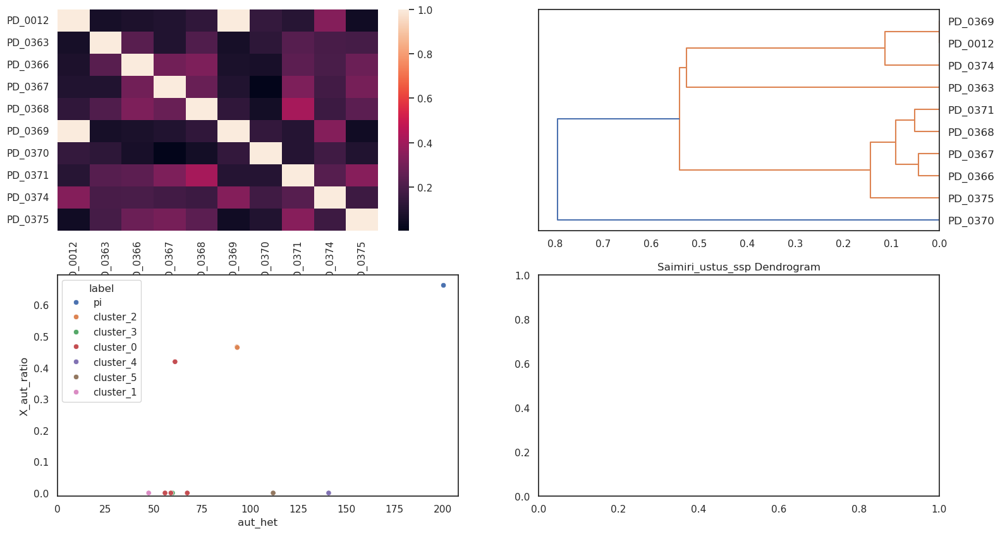

<Figure size 640x480 with 0 Axes>

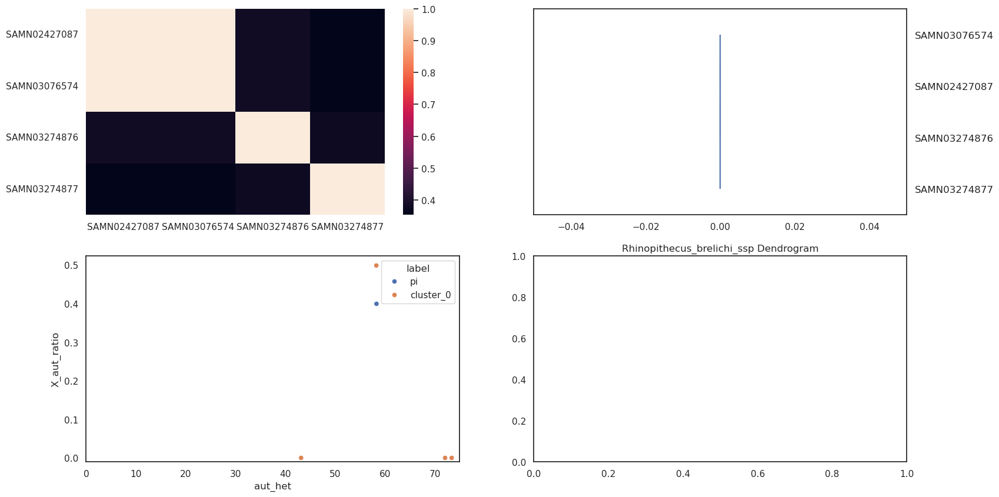

<Figure size 640x480 with 0 Axes>

In [154]:
# Old run - I have updated the Fst workflow after I made these plots
df_lp, df_lh, df_lfst = [], [], []
for x in full_dfs:
    fig, axes = plt.subplots(2, 2, figsize=(18, 10))
    df_pi = pd.read_csv("../results/window_stats/{}_100kb_pi.txt".format(x), sep="\t", index_col=[0])
    aut_pi = df_pi.loc[(df_pi.callable_frac >= 0.75) & (df_pi.chr_type == "aut")]["pi"].mean()
    df_pi["norm_pi"] = df_pi["pi"]/aut_pi
    df_lp.append(df_pi)
    df_het = pd.read_csv("../results/window_stats/{}_100kb_het.txt".format(x), sep="\t", index_col=[0])
    df_lh.append(df_het)
    df_fst = pd.read_csv("../results/window_stats/{}_Fst.txt".format(x), sep="\t", index_col=[0])
    df_lfst.append(df_fst)
    # Clustering based on Fst
    aut_fst = df_fst.loc[df_fst.chr_type == "aut"].iloc[-len(df_fst.columns)+4:,:len(df_fst.columns)-4].fillna(0)
    model = AgglomerativeClustering(distance_threshold=0.1, n_clusters=None, metric="precomputed", linkage="average")
    model = model.fit(aut_fst.clip(0))
    plt.title("{} Dendrogram".format(x))
    plot_dendrogram(model, truncate_mode="level", p=10, ax=axes[0, 1])
    plt.figure()
    # Heatmap of autosomal landscape correlation.
    sns.heatmap(df_het.loc[(df_het.chr_type == "aut") &
          (df_het.callable_frac >= 0.75)].iloc[:,:len(df_fst.columns)-4].corr(), ax=axes[0, 0])
    # X autosome ratio
    df_het.insert(0, "pi", df_pi.pi)
    ratio_df = df_het.loc[df_het.callable_frac >= 0.75].groupby(["chr_type"])[df_het.iloc[:,:-6].columns].mean().reset_index()
    long_df = pd.melt(ratio_df, id_vars = "chr_type", var_name='sample_ID', value_name='aut_het')
    x_aut_df = long_df.loc[long_df.chr_type == "aut"].reset_index()
    x_aut_df["X_aut_ratio"] = long_df.loc[long_df.chr_type == "chrX"].reset_index().aut_het/x_aut_df.aut_het
    label_map = {}
    label_map["pi"] = "pi"
    for i in range(len(model.labels_)):
        label_map[df_het.columns[i+1]] = "cluster_{}".format(model.labels_[i])
    x_aut_df["label"] = x_aut_df.sample_ID.map(label_map)
    g = sns.scatterplot(x_aut_df, x="aut_het", y="X_aut_ratio", ax=axes[1, 0], hue="label")
    g.set(xlim=(-0.01, None), ylim=(-0.01, None))
    plt.tight_layout()

<Axes: >

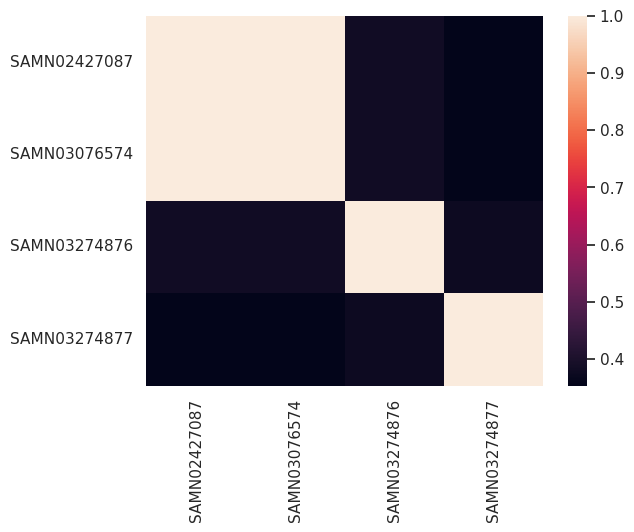

In [51]:
sns.heatmap(df_het.loc[(df_het.chr_type == "aut") &
          (df_het.callable_frac >= 0.75)].iloc[:,:len(df_fst.columns)-4].corr())

In [52]:
aut_fst

,SAMN02427087,SAMN03076574,SAMN03274876,SAMN03274877
0,0.000000,-0.998840,-0.082483,-0.312204
1,-0.998840,0.000000,-0.082394,-0.312091
2,-0.082483,-0.082394,0.000000,-0.247092
3,-0.312204,-0.312091,-0.247092,0.000000
